# VisEval Dataset [Link](https://github.com/microsoft/VisEval/tree/main)



## Introduction

VisEval dataset is a large-scale and high-quality dataset for Nature Language to Visualization (NL2VI) task. It contains 2,524 (NL, VIS) pairs, supports 7 common types of visualizations and covers 146 databases. 

- **VisEval.json** stores the JSON format of (NL, VIS) pairs. The natural language (NL) is a sentence that describes the desired visualization. The visualization (VIS) is represented in JSON format, including chart type, data for the x-axis, y-axis, and z-axis, as well as information such as sorting requirements.
- **databases** contains 146 databases, and each database has several data tables saved in CSV format.


## Important Notes
- How was the data collected? The dataset was constructed based on [nvBench](https://github.com/TsinghuaDatabaseGroup/nvBench). We selected high-quality queries from the original dataset, and we corrected and annotated the dataset ourselves. More details are provided in our paper's subsection 4.1.

In [1]:
from settings import Settings
import pandas as pd
import utils
import warnings 
from tqdm.notebook import tqdm

pd.set_option('display.max_colwidth',None)
warnings.filterwarnings("ignore")

In [2]:
settings = Settings()
dataset_path = settings.VISEVAL_DATASET_PATH

#visEval json
data = pd.read_json(f"{dataset_path}/visEval.json")
data = data.transpose()
print("visEval Dataset size:", data.shape)
print("Total queries:", sum(data['nl_queries'].apply(lambda x: len(x))))
print("\n")

#visEval_single json
single = pd.read_json(f"{dataset_path}/visEval_single.json")
single = single.transpose()
print("visEval_single Dataset size:", single.shape)
print("Total queries:", sum(single['nl_queries'].apply(lambda x: len(x))))
print("\n")

#visEval_multiple json
multiple = pd.read_json(f"{dataset_path}/visEval_multiple.json")
multiple = multiple.transpose()
print("visEval_multiple Dataset size:", multiple.shape)
print("Total queries:", sum(multiple['nl_queries'].apply(lambda x: len(x))))


visEval Dataset size: (1150, 8)
Total queries: 2524


visEval_single Dataset size: (688, 8)
Total queries: 1588


visEval_multiple Dataset size: (462, 8)
Total queries: 936


# Exploratory Data Analysis - VisEval Dataset

In [3]:
# Create visualization dataframes from the main dataset for plotting different chart types
viz_dfs = utils.create_plotting_dataframes(data)

Running comprehensive VisEval dataset analysis...
Analysis complete!


In [8]:
# Extract hardness distribution data and display column information
hardness_dist_df = viz_dfs['pie_charts']['hardness_dist']
print(list(hardness_dist_df.columns))

# Create a do nut chart visualization showing the distribution of hardness levels in the dataset
utils.plot(data = hardness_dist_df, chart_name='pie', x_col='hardness', y_col='count', title='Hardness Distribution')

['hardness', 'count']
✅ High-resolution image saved as: plot.png


In [17]:
# Extract chart type distribution data and display column information
chart_type_dist_df = viz_dfs['pie_charts']['chart_type_dist']
print(list(chart_type_dist_df.columns))

# Create a bar chart visualization showing the distribution of different chart types in the dataset
utils.plot(data = chart_type_dist_df, chart_name='bar', x_col='chart_type', y_col='count', title='Chart type Distribution')

['chart_type', 'count', 'percentage']
✅ High-resolution image saved as: plot.png


In [32]:
# Extract complexity by hardness box plot data and display column information
complexity_hardness_df = viz_dfs['box_plots']['complexity_by_hardness']
print(list(complexity_hardness_df.columns))

# Create a box plot visualization showing the distribution of complexity scores across different hardness levels
utils.plot(data = complexity_hardness_df, chart_name='box', x_col='hardness', y_col='complexity_score', title='Complexity by hardness Distribution')

['hardness', 'complexity_score', 'num_joins', 'num_aggregations']
✅ High-resolution image saved as: plot.png


In [4]:
# Create a heatmap visualization showing the relationship between chart types and hardness levels
# This helps identify which chart types are more common at different difficulty levels

# utils.plot(data=data[['chart', 'hardness']],chart_name='heatmap', x_col = 'chart', y_col = 'hardness', title='Distribution b/w chart type and hardness')
fig = utils.plot(data= data[['chart', 'hardness']], chart_name='heatmap', x_col='chart', y_col='hardness', title='Distribution b/w chart type and hardness')

# Export to high-resolution image (requires kaleido)
fig.write_image("heatmap_highres.png", scale=6, width=900, height=700)


# Agents Evaluation

In [ ]:
import datetime
from agents import Nl2Viz, CoML4VIS, Chat2vis, Lida
import models
import os
import time
from dataset import Dataset
from evaluate import Evaluator, EvaluationResult
from typing_extensions import List


def create_agent(agent_name, llm, config = None):
    if agent_name == 'Nl2VizAgent':
        return Nl2Viz(llm=llm, config=config)
    elif agent_name == 'CoML4VIS':
        return CoML4VIS(llm=llm, config=config)
    elif agent_name == 'Chat2vis':
        return Chat2vis(llm=llm, config=config)
    # elif agent_name =='Lida':
    #     llm = utils.to_textgenerator(llm)
        # return Lida(llm=llm, config=config)
    else:
        raise ValueError(f"Unknown agent: {agent_name}") 
    
def evaluate_agent_with_model(agent_name:str, 
                              model_name:str,
                              dataset_folder:str,
                              chromedriver_path:str,
                              library: str,
                              results_list: List, 
                              specific_ids: List) -> EvaluationResult:

    # Initialize dataset
    dataset = Dataset(folder=dataset_folder)
    timestamp = datetime.datetime.now().strftime("%Y%m%d")
    log_folder = f"logs/{agent_name}_{model_name}_{timestamp}"
    os.makedirs(log_folder, exist_ok=True)
    config = {
            "logs": f"{log_folder}/{agent_name}_{model_name}_{len(specific_ids)}samples_logs",
            "library": library,
            "webdriver_path": chromedriver_path,
    }

    print(f"\n{'#'*20} EVALUATING {agent_name} WITH {model_name} {'#'*20}")

    llm = models.setup_llm(model_name)
    agent = create_agent(agent_name, llm, config)
    evaluator = Evaluator(webdriver_path=chromedriver_path, vision_model=llm)

    start_time = time.time()
    result = evaluator.evaluate(agent=agent, dataset=dataset, config=config, specific_ids=specific_ids)
    end_time = time.time()

    execution_time = end_time - start_time
    score = result.score()

    detail_records = result.detail_records()
    results_list.append({
            'agent': agent_name,
            'model': model_name,
            'library': library,
            'score': score,
            'invalid_rate': score['invalid_rate'],
            'illegal_rate': score['illegal rate'],
            'pass_rate': score['pass_rate'],
            'readability_score': score['readability_score'],
            'quality_score': score['quality_score'],
            'execution_time': execution_time,
            'timestamp': timestamp
        })
    
    print(f"Score for {agent_name} with {model_name}: {score}")
    print(f"Execution time: {execution_time:.2f} seconds")
    print(f"{'#'*20} COMPLETED {agent_name} WITH {model_name} {'#'*20}\n")
    return detail_records


IDS: ['4034', '707', '2633', '3262', '4035', '1166@y_name@ASC', '1129', '2845@y_name@ASC', '2781', '46', '2615', '4022', '1807', '1515', '354', '1795@x_name@DESC', '1326', '2280', '642@x_name@DESC', '1973', '4021', '591', '1285', '2755@x_name@DESC', '4029', '921@y_name@DESC', '196', '2165@y_name@DESC', '2709', '517', '2464', '1971', '682@x_name@ASC', '296', '387', '1090', '1375@x_name@ASC', '803', '1012', '2958', '403', '789', '753@x_name@DESC', '4026', '1963@y_name@DESC', '3227', '997@x_name@DESC', '1241', '1972', '2028@y_name@DESC', '1079', '3097', '522@y_name@DESC', '544@x_name@DESC', '920@y_name@ASC', '1621', '1621']
Total samples:  57


Agents:   0%|          | 0/3 [00:00<?, ?it/s]

Models:   0%|          | 0/6 [00:00<?, ?it/s]

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Nl2VizAgent WITH gpt4o ####################
[Nl2VizAgent] Initialized ====
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt 

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Nl2VizAgent WITH gpt5 ####################
[Nl2VizAgent] Initialized ====
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====


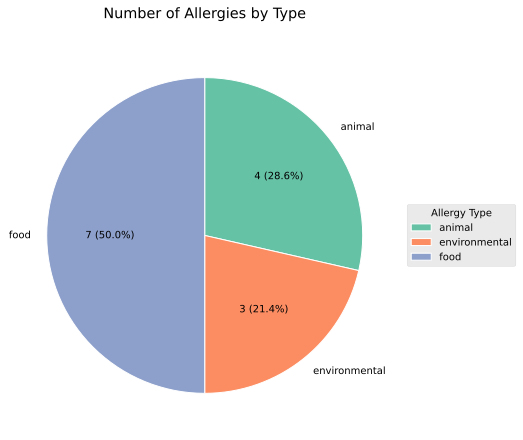

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': True, 'aspect': 'deconstruction', 'rationale': 'Deconstructed the chart successfully.'}, {'answer': True, 'aspect': 'chart type check', 'rationale

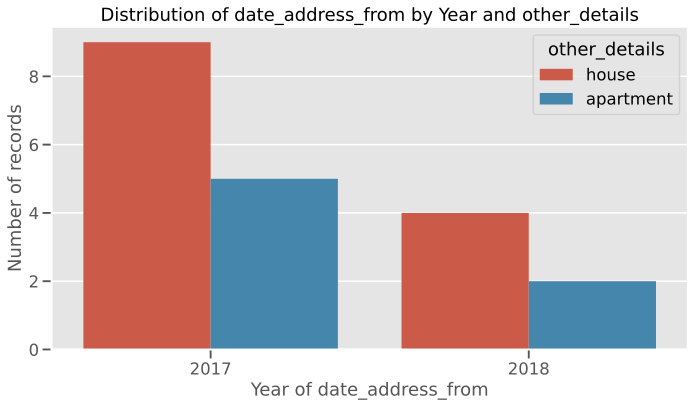

[Nl2VizAgent] execute completed =====

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" encoding="utf-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
  "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<svg xmlns:xlink="http://www.w3.org/1999/xlink" width="432pt" height="360pt" viewBox="0 0 432 360" xmlns="http://www.w3.org/2000/svg" version="1.1">
 <metadata>
  <rdf:RDF xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:cc="http://creativecommons.org/ns#" xmlns:rdf="http://

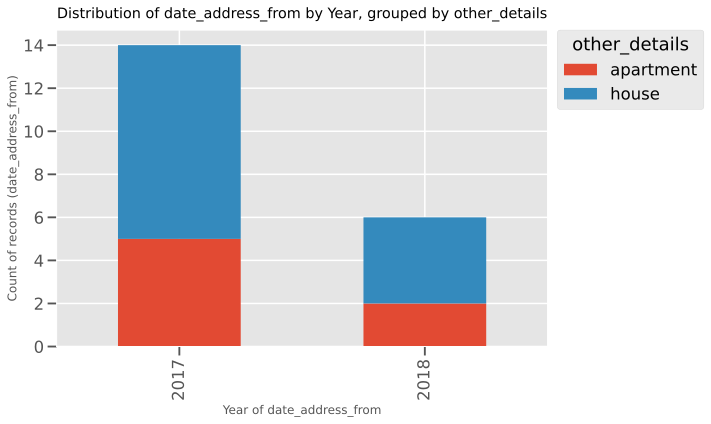

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse 

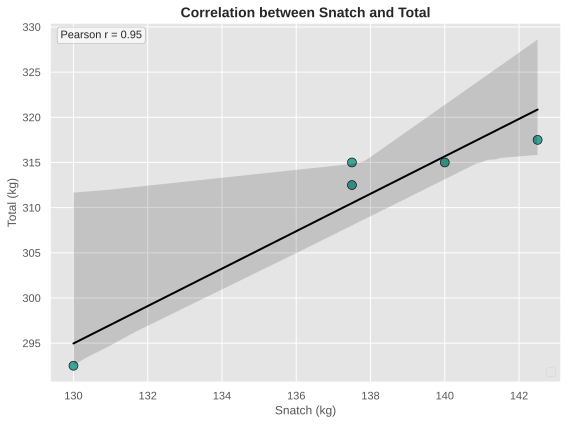

[Nl2VizAgent] execute completed =====

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====


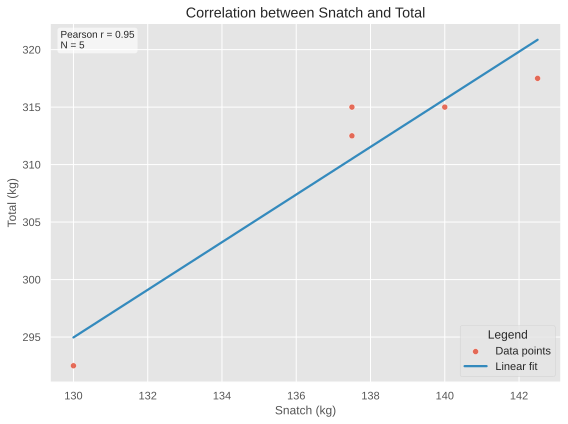

[Nl2VizAgent] execute completed =====

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed succes

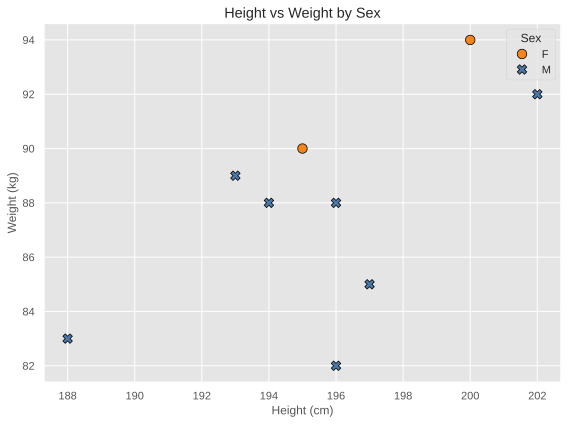

[Nl2VizAgent] execute completed =====

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" encoding="utf-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
  "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<svg xmlns:xlink="http://www.w3.org/1999/xlink" width="568.8pt" height="424.8pt" viewBox="0 0 568.8 424.8" xmlns="http://www.w3.org/2000/svg" version="1.1">
 <metadata>
  <rdf:RDF xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:cc="http://creativecommons.org/ns#" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
   <cc:Work>
    <dc:t

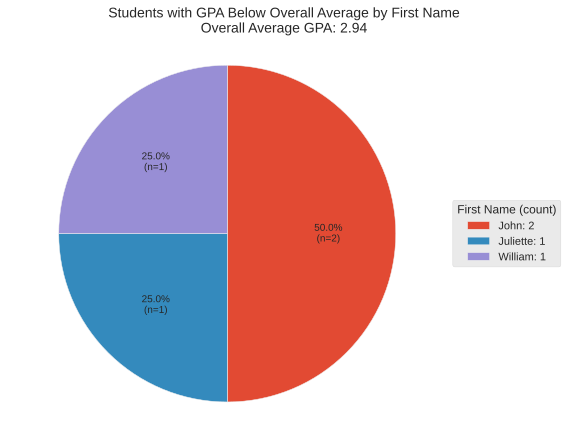

[Nl2VizAgent] execute completed =====

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" encoding="utf-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
  "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<svg xmlns:xlink="http://www.w3.org/1999/xlink" width="569.057055pt" height="426.96pt" viewBox="0 0 569.057055 426.96" xmlns="http://www.w3.org/2000/svg" version="1.1">
 <metadata>
  <rdf:RDF xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:cc="http://creativecommons.org/ns#" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
   <cc:Work>

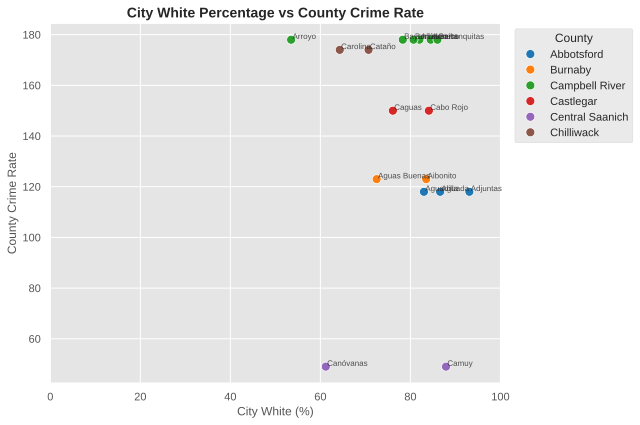

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] Execution error: Could not interpret value `County` for `hue`. An entry with this name does not appear in `data`.

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_gener

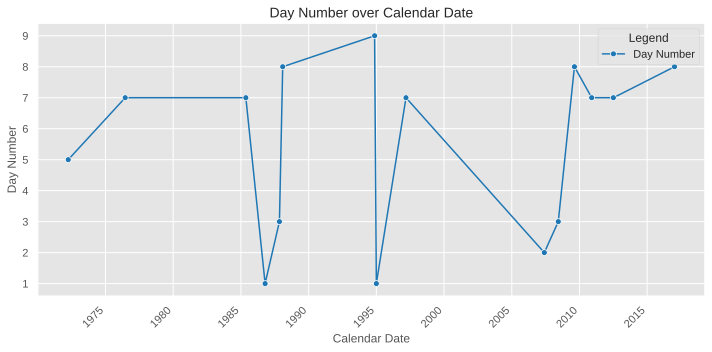

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====


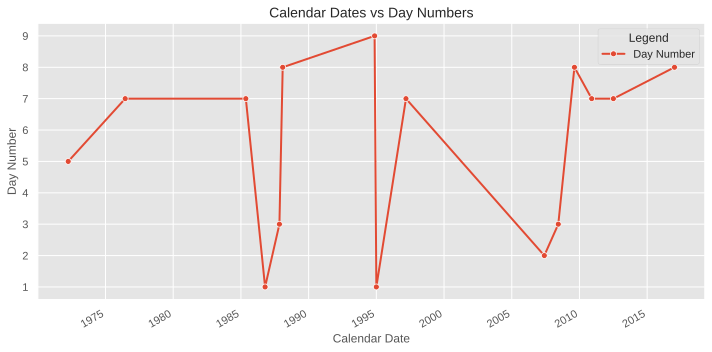

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse 

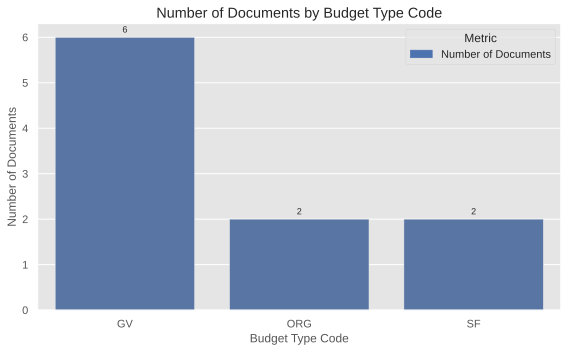

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" enc

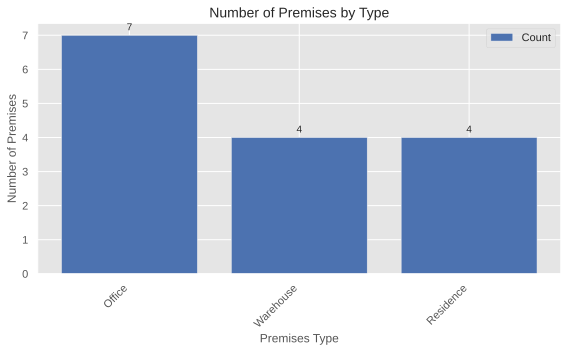

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====


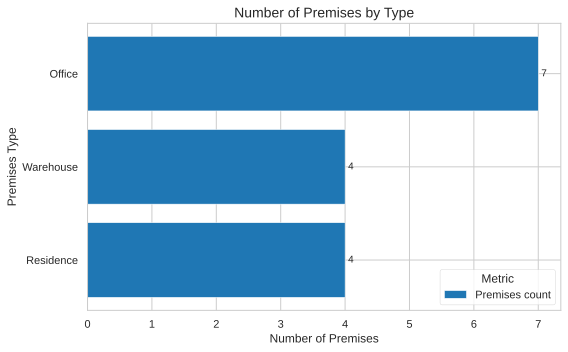

[Nl2VizAgent] execute completed =====

NL QUERY[3]: Create a bar chart showing the total number across premises type

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed

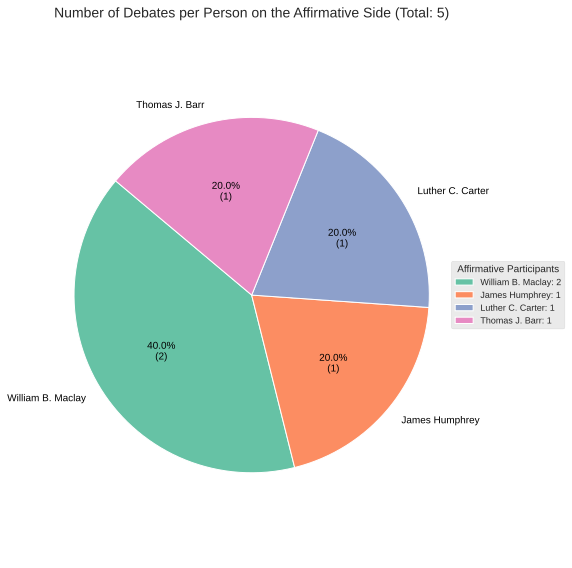

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_genera

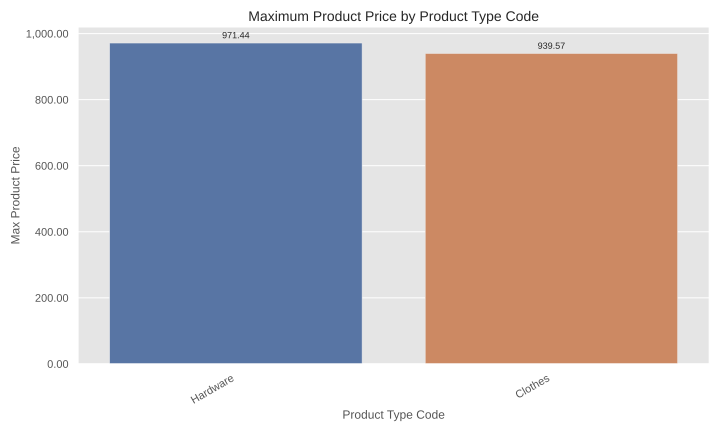

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code execution', 'rationale': '\'int\' object has no attribute \'update\'\n\nTraceback (most recent call last):\n  File "/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/src/agents/nl2viz.py", line 182, in execute\n    exec(code_with_svg_capture, execution_env)\n    ~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^\n  File "<string>", line 36, in <module>\n  File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/matplotlib/pyplot.py", line 798, in setp\n    return matplotlib.artist.setp(obj, *args, **kwargs)\n           ~~~~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^\n  File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-

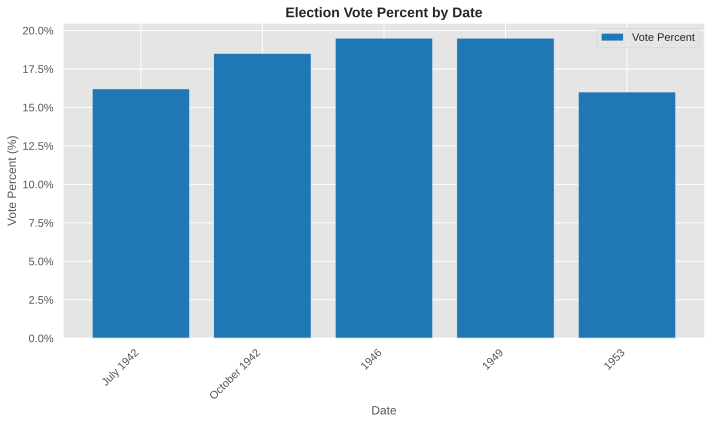

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED********************************************

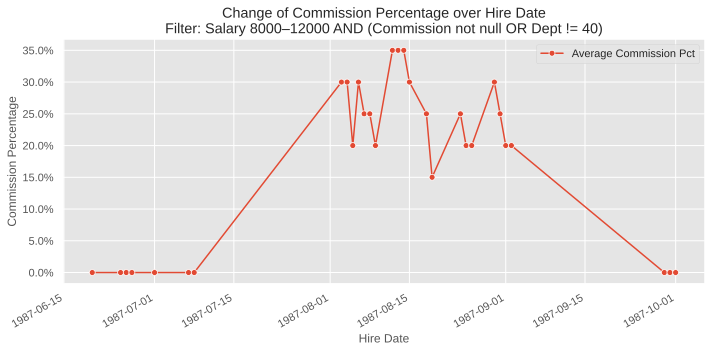

[Nl2VizAgent] execute completed =====

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" encoding="utf-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
  "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<svg xmlns:xlink="http://www.w3.org/1999/xlink" width="712.8pt" height="352.8pt" viewBox="0 0 712.8 352.8" xmlns="http://www.w3.org/2000/svg" version="1.1">
 <metadata>
  <rdf:RDF xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:cc="http://cr

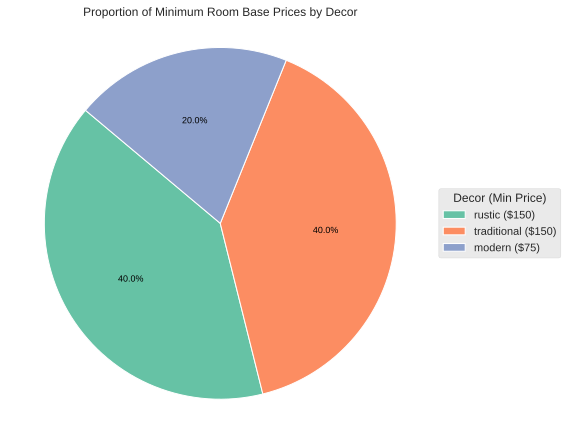

[Nl2VizAgent] execute completed =====

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code

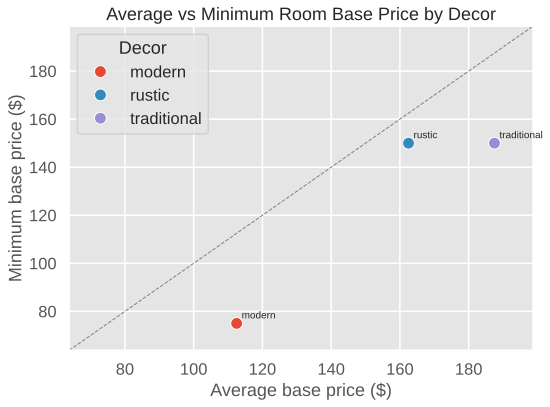

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" encoding="utf-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
  "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<svg xmlns:xlink="http://www.w3.org/1999/xlink" width="576pt" height="432pt" viewBox="0 0 576 432" xmlns="http://www.w3.org/2000/svg" version="1.1">
 <metadata>
  <rdf:RDF xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:cc="http://creativecommons.org/ns#" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
   <cc:Work>
    <dc:type rdf:resource="http:

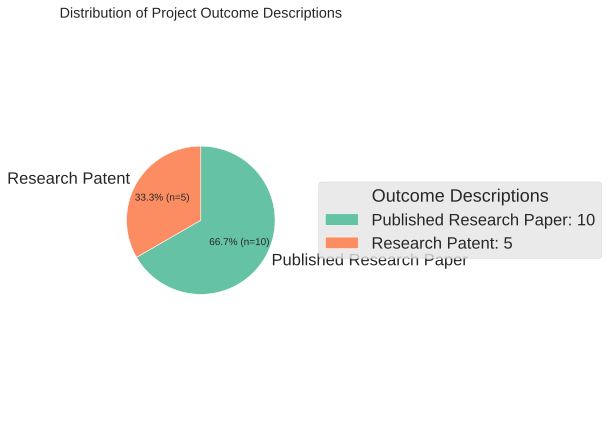

[Nl2VizAgent] execute completed =====

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====


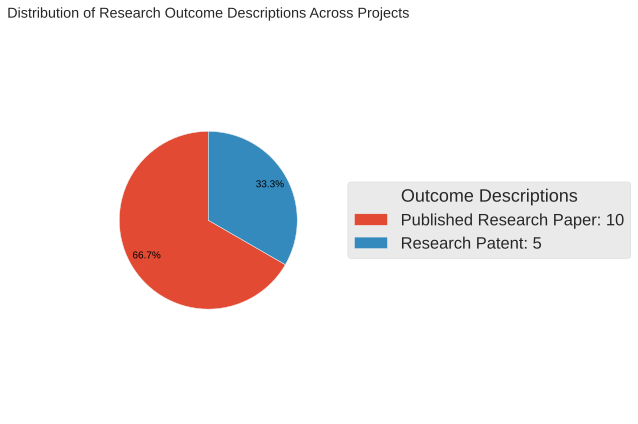

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse

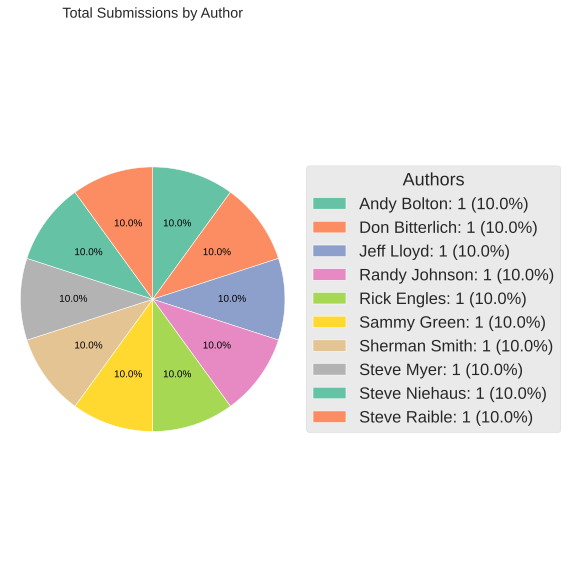

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
<?xml version="1.0" encoding="utf-8" standalone="no"?>
<!DOCTYPE svg PUBLIC "-//W3C//DTD SVG 1.1//EN"
  "http://www.w3.org/Graphics/SVG/1.1/DTD/svg11.dtd">
<svg xmlns:xlink="http://www.w3.org/1999/xlink" width="572.7065pt" height="560.358813pt" viewBox="0 0 572.7065 560.358813" xmlns="http://www.w3.org/2000/svg" version="1.1">
 <metadata>
  <rdf:RDF xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:cc="http://creativecommons.org/ns#" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
   <cc:Work>
    <dc:type rdf:resource="http://p

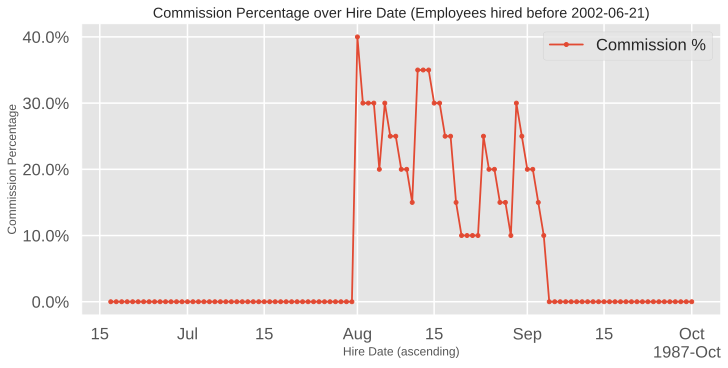

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': '

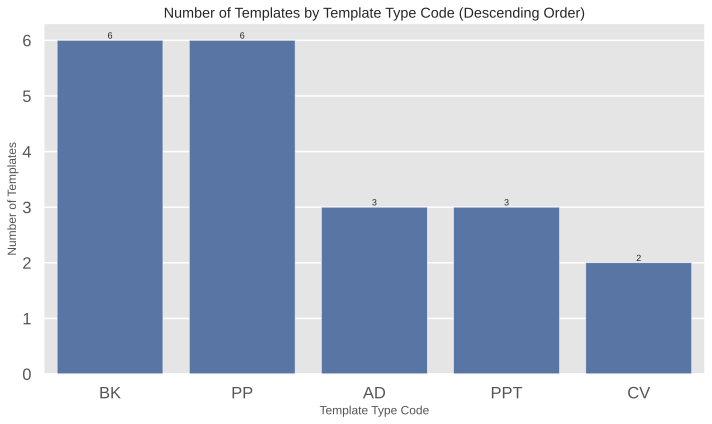

[Nl2VizAgent] execute completed =====

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Can

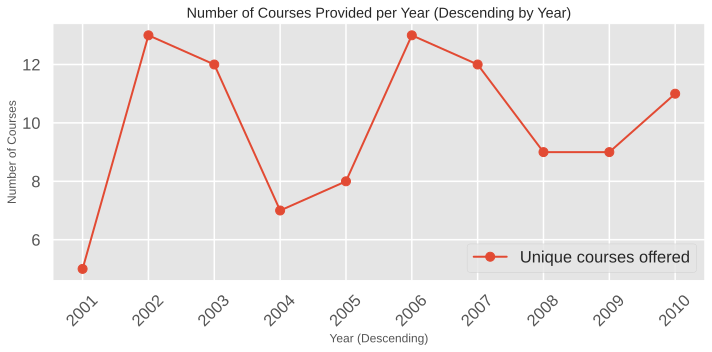

[Nl2VizAgent] execute completed =====

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====


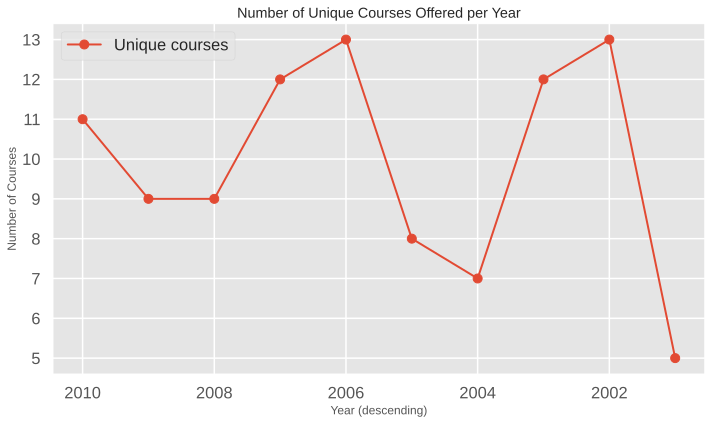

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'C

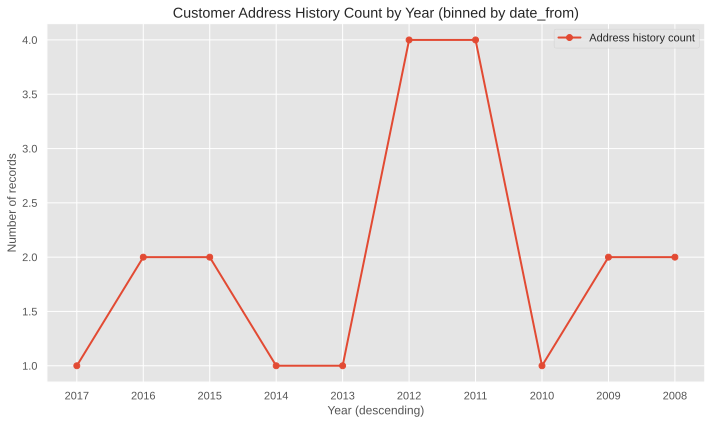

[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started ====

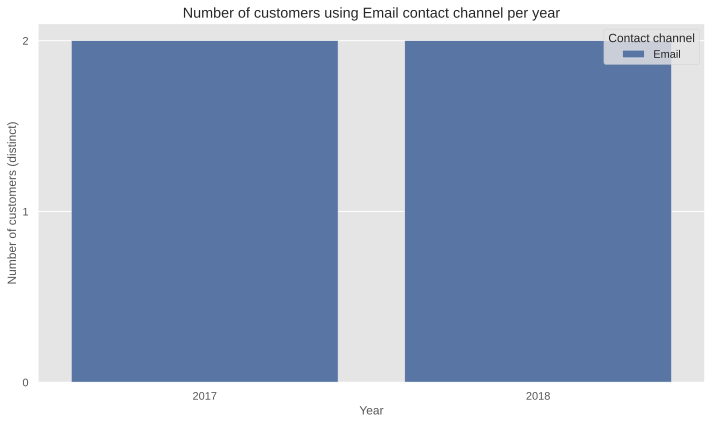

[Nl2VizAgent] execute completed =====

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the vis

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Nl2VizAgent WITH claude_3_5_sonnet ####################
AWS Access Key loaded: True
AWS Secret Key loaded: True
[Nl2VizAgent] Initialized ====
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  196
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A bar chart shows the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Nl2VizAgent] generate started =====
[Nl2

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show me about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Visualize a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Return a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  296
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 296
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  354
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Snatch and  Total .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_c

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a scatter chart about the correlation between  Snatch and  Total .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A scatter chart shows the correlation between  Snatch and  Total .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  387
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A grouped scatter chart shows the correlation between  Height and  Weight , and group by attribute Sex.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show height vs weight as scatter plot use a different color for each Sex

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 387
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  403
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Count the number of people o

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 403
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  517
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of students whose gpa is lower than the average gpa of all students for different first name in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_gener

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 517
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  591
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of courses offered by Psychology department in each year with a group line chart grouping by semester.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[N

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many courses are in the Psychology department in each year? Show a group line chart grouping by semester.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 591
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  707
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show white percentages of cities and the crime rates of counties they are in with a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_ta

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the white percentages of cities, and the corresponding crime rates of the counties they correspond to. Show scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 707
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  789
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show all calendar dates and 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  803
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show budget type codes and the number of documents in each budget type with a bar chart.

[Nl2VizAgent] generate start

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the different budget type codes, and how many documents are there for each. Plot them as bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Give me a bar chart for the total number of each budget type code

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 803
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1012
**************************************************INSTANCE STARTED**

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Create a bar chart showing the total number across premises type

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1079
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of debates for each person on the affirmative side in a pie chart.

[Nl2VizAgent] generate started =

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart about the different countries and the number of members from each.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1090
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1129
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the highest price of product, grouped by product type? Show a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts com

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the maximum product price for each product type in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Bar chart x axis product type code y axis maximal product price

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1241
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between oldest age and average age and group by sex in a group scatter chart.

[Nl2VizAgent] g

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Scatterplot of maximal age vs avg(age) colored by Sex

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1241
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1285
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Which tests have "Pass" results? Return the dates when the tests were taken, and count them by a line chart

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgen

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1285
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1326
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: List the dates and vote percents of elections in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_gene

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the dates and vote percents of elections. Show bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the company name with the number of gas station in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1515
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1621
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the trend of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2Vi

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, draw a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, show me about the change of  commission_pct over  hire_date  in a line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the change of  commission_pct over  hire_date 

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[6]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, visualize a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [6]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1621
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED*************************************************

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose first name is ending with the letter m, show the proportion of the first name using a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1807
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1971
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the proportion of the minimum price of the rooms for each different decor? Show me a pie chart!

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Please use a pie chart to show the proportion of the minimum price of the rooms in a different decor.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1972
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize two attr: the average and minimum price of the rooms in different decor using a 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1972
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1973
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize three attr: the average and minimum price of the rooms in different decor using a scatter.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_g

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1973
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2280
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those records from the products and each product's manufacturer, a scatter chart shows the correlation between price and revenue , and colored by manufacturer's name.

[Nl2VizAgent] generate started ===

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those records from the products and each product's manufacturer, show me about the correlation between price and revenue , and colored by manufacturer's name in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2280
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2464
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Pie chart. how many people are under 40 for each gender?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgen

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many people are under 40 for each gender. Show a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2464
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2615
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the payment date of the payment with amount paid higher than 300 or with payment type is 'Check', bin the payment date by month and count them by a bar chart

[Nl2VizAgent] generate started =====
[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2615
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2633
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of institutions and total enrollment for each type with a scatter plot.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prom

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2633
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2709
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of schools in each county and total enrollment in each county by a grouped scatter plot.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_cod

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Plot the number of schools and total enrollment in each county with a grouped scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show count(*) vs total number of enrollment as scatter plot use a different color for each County

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2709
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2781
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find players with a overall rating greater than or equal to 75 and use line chart to show the trend in the year of b

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2781
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2958
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the descriptions of all the project outcomes, and count them by a pie chart

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgen

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the description of the outcomes for all projects, and count them by a pie chart

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A pie chart for what are the number of the descriptions of all the project outcomes?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3097
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Scatterplot of all_games_p

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3097
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3227
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those wines whose price is bigger than 100, group by grape, count their total number of each year and sort by year in asc in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _c

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3227
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3262
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the authors of their total submissions with a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_gene

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3262
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2845@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find names of trains that run through stations for the local authority Chiltern, compare the total number of name in a bar graph, and sort in asc by the y-axis.

[Nl2VizAgent] generate started ==

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2845@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1166@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many treatments each professional has operated? Show a bar chart that groups by professional's first name, order y-axis in ascending order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts complete

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the number of treatments each professional has operated with a bar chart that groups by professional's first name, show in ascending by the y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1166@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1795@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees who was hired before 2002-06-21, draw a line chart about the change of commission_pct over hire_date , could you list by the X in ascending?

[Nl2VizAgent] generat

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees who was hired before 2002-06-21, show me about the change of commission_pct over hire_date in a line chart, and list in asc by the x-axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees who was hired before 2002-06-21, a line chart shows the change of commission_pct over hire_date, and I want to display in asc by the x-axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1963@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Give the name of each department and the number of employees in each Plot them as bar chart,

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the name of each department and the number of employees in each in a bar chart, and could you sort by the y-axis from high to low?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1963@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  753@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Visualize a bar chart for what are the different template type codes, and how many templates correspond to each?, and could you show in desc by the x axis?

[Nl2VizAgent] generate sta

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all template type codes and number of templates for each Visualize by bar chart, order X-axis in descending order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  642@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Plot year by count the total number as a trend line, note that binning year and display x axis

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Find the number of courses provided in each year with a line chart, and show by the year in desc.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  682@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Bar chart x axis industry y axis the number of industry, could you list in ascending by the X-a

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 682@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2165@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the name of the technician whose team is not 'NYY', and count them by a bar chart, show by the total number from high to low.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[N

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A bar chart for listing the number of the name of technicians whose team is not "NYY", order by the y axis in desc please.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: List the name of technicians whose team is not "NYY", and count them by a bar chart, could you list Y from high to low order?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2165@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  997@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of customer address history in each year and bin date from by year interval w

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts comp

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2028@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  920@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers that use email as the contact channel for each year Visualize with a bar chart, and order in ascending by the y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts compl

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  921@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers with different contact channel and pay method in a stacked bar chart, sort in descending by the y-axis please.

[Nl2VizAgent] generate started =====
[Nl2Viz

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 921@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1375@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line graphs showing trends of year of birth of entrepreneurs, could you list x axis in ascending order please?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A line chart for returning the number of the dates(bin by year) of birth for entrepreneurs, sort X in ascending order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1375@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  522@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many courses each teacher taught? Show me a stacked bar chart The x-axis is the instructor's first name and group by course code, could you sort the number of emp fname in descendi

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 522@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  544@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of professors in each office with a bar chart, could you display in descending by office?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 544@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2755@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show me a stacked bar graph, the x-axis is the nationality of ship, and the y-axis is their total number of different nationality and split by ship type, and show X-axis in desc order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2755@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4021
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those top 10 departments, show the relationship between the budget and the number of employees. Scatter plot.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_ge

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4021
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4022
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Display the total payment amounts for each method, and use a stacked bar chart to illustrate how payments are distributed among different customer statuses.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4022
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4026
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line chart shows the number of chip model launched each year colored by WiFi.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _con

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4026
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4029
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A line chart depicting the count of players born from 1980 to 1989 (including 1980, excluding 1990), categorized by their preferred foot. Bin the birthday by year.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4029
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4034
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: The maximum salary of players in teams ARI, ATL, and CHA in each year start from 2000. Line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started ===

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4034
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4035
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many 4-credit courses are there in each semester each year? Line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _const

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4035
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


EVALUATION DETIALS:
[EvaluationDetail(id='46', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')]]), EvaluationDetail(id='196', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generat

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Nl2VizAgent WITH claude_3_haiku ####################
[Nl2VizAgent] Initialized ====
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  196
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A bar chart shows the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Nl2VizAgent] generate started =====
[Nl2

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show me about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Visualize a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Return a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  296
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 296
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  354
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Snatch and  Total .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_c

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a scatter chart about the correlation between  Snatch and  Total .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A scatter chart shows the correlation between  Snatch and  Total .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  387
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A grouped scatter chart shows the correlation between  Height and  Weight , and group by attribute Sex.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show height vs weight as scatter plot use a different color for each Sex

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 387
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  403
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Count the number of people o

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 403
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  517
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of students whose gpa is lower than the average gpa of all students for different first name in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_gener

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 517
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  591
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of courses offered by Psychology department in each year with a group line chart grouping by semester.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[N

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many courses are in the Psychology department in each year? Show a group line chart grouping by semester.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 591
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  707
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show white percentages of cities and the crime rates of counties they are in with a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_ta

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the white percentages of cities, and the corresponding crime rates of the counties they correspond to. Show scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 707
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  789
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show all calendar dates and 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  803
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show budget type codes and the number of documents in each budget type with a bar chart.

[Nl2VizAgent] generate start

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the different budget type codes, and how many documents are there for each. Plot them as bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Give me a bar chart for the total number of each budget type code

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 803
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1012
**************************************************INSTANCE STARTED**

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Create a bar chart showing the total number across premises type

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1079
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of debates for each person on the affirmative side in a pie chart.

[Nl2VizAgent] generate started =

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart about the different countries and the number of members from each.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1090
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1129
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the highest price of product, grouped by product type? Show a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts com

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the maximum product price for each product type in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Bar chart x axis product type code y axis maximal product price

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1241
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between oldest age and average age and group by sex in a group scatter chart.

[Nl2VizAgent] g

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Scatterplot of maximal age vs avg(age) colored by Sex

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1241
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1285
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Which tests have "Pass" results? Return the dates when the tests were taken, and count them by a line chart

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgen

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1285
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1326
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: List the dates and vote percents of elections in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_gene

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the dates and vote percents of elections. Show bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the company name with the number of gas station in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1515
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1621
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the trend of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2Vi

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, draw a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, show me about the change of  commission_pct over  hire_date  in a line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the change of  commission_pct over  hire_date 

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[6]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, visualize a line chart about the change of  commission_pct over  hire_date .

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [6]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1621
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED*************************************************

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose first name is ending with the letter m, show the proportion of the first name using a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1807
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1971
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the proportion of the minimum price of the rooms for each different decor? Show me a pie chart!

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Please use a pie chart to show the proportion of the minimum price of the rooms in a different decor.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1972
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize two attr: the average and minimum price of the rooms in different decor using a 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1972
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1973
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize three attr: the average and minimum price of the rooms in different decor using a scatter.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_g

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1973
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2280
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those records from the products and each product's manufacturer, a scatter chart shows the correlation between price and revenue , and colored by manufacturer's name.

[Nl2VizAgent] generate started ===

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those records from the products and each product's manufacturer, show me about the correlation between price and revenue , and colored by manufacturer's name in a scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2280
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2464
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Pie chart. how many people are under 40 for each gender?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgen

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many people are under 40 for each gender. Show a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2464
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2615
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the payment date of the payment with amount paid higher than 300 or with payment type is 'Check', bin the payment date by month and count them by a bar chart

[Nl2VizAgent] generate started =====
[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2615
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2633
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of institutions and total enrollment for each type with a scatter plot.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prom

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2633
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2709
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of schools in each county and total enrollment in each county by a grouped scatter plot.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_cod

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Plot the number of schools and total enrollment in each county with a grouped scatter chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show count(*) vs total number of enrollment as scatter plot use a different color for each County

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2709
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2781
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find players with a overall rating greater than or equal to 75 and use line chart to show the trend in the year of b

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2781
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2958
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the descriptions of all the project outcomes, and count them by a pie chart

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgen

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the description of the outcomes for all projects, and count them by a pie chart

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A pie chart for what are the number of the descriptions of all the project outcomes?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3097
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Scatterplot of all_games_p

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3097
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3227
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those wines whose price is bigger than 100, group by grape, count their total number of each year and sort by year in asc in a bar chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _c

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3227
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3262
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the authors of their total submissions with a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_gene

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3262
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2845@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find names of trains that run through stations for the local authority Chiltern, compare the total number of name in a bar graph, and sort in asc by the y-axis.

[Nl2VizAgent] generate started ==

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2845@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1166@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many treatments each professional has operated? Show a bar chart that groups by professional's first name, order y-axis in ascending order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts complete

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the number of treatments each professional has operated with a bar chart that groups by professional's first name, show in ascending by the y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1166@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1795@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees who was hired before 2002-06-21, draw a line chart about the change of commission_pct over hire_date , could you list by the X in ascending?

[Nl2VizAgent] generat

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees who was hired before 2002-06-21, show me about the change of commission_pct over hire_date in a line chart, and list in asc by the x-axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees who was hired before 2002-06-21, a line chart shows the change of commission_pct over hire_date, and I want to display in asc by the x-axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1963@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Give the name of each department and the number of employees in each Plot them as bar chart,

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the name of each department and the number of employees in each in a bar chart, and could you sort by the y-axis from high to low?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1963@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  753@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Visualize a bar chart for what are the different template type codes, and how many templates correspond to each?, and could you show in desc by the x axis?

[Nl2VizAgent] generate sta

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all template type codes and number of templates for each Visualize by bar chart, order X-axis in descending order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  642@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Plot year by count the total number as a trend line, note that binning year and display x axis

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Find the number of courses provided in each year with a line chart, and show by the year in desc.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  682@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Bar chart x axis industry y axis the number of industry, could you list in ascending by the X-a

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 682@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2165@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the name of the technician whose team is not 'NYY', and count them by a bar chart, show by the total number from high to low.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[N

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A bar chart for listing the number of the name of technicians whose team is not "NYY", order by the y axis in desc please.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: List the name of technicians whose team is not "NYY", and count them by a bar chart, could you list Y from high to low order?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2165@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  997@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of customer address history in each year and bin date from by year interval w

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts comp

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2028@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  920@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers that use email as the contact channel for each year Visualize with a bar chart, and order in ascending by the y axis.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts compl

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  921@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers with different contact channel and pay method in a stacked bar chart, sort in descending by the y-axis please.

[Nl2VizAgent] generate started =====
[Nl2Viz

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 921@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1375@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line graphs showing trends of year of birth of entrepreneurs, could you list x axis in ascending order please?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A line chart for returning the number of the dates(bin by year) of birth for entrepreneurs, sort X in ascending order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1375@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  522@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many courses each teacher taught? Show me a stacked bar chart The x-axis is the instructor's first name and group by course code, could you sort the number of emp fname in descendi

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 522@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  544@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of professors in each office with a bar chart, could you display in descending by office?

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 544@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2755@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show me a stacked bar graph, the x-axis is the nationality of ship, and the y-axis is their total number of different nationality and split by ship type, and show X-axis in desc order.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2755@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4021
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those top 10 departments, show the relationship between the budget and the number of employees. Scatter plot.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_ge

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4021
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4022
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Display the total payment amounts for each method, and use a stacked bar chart to illustrate how payments are distributed among different customer statuses.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4022
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4026
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line chart shows the number of chip model launched each year colored by WiFi.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _con

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4026
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4029
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A line chart depicting the count of players born from 1980 to 1989 (including 1980, excluding 1990), categorized by their preferred foot. Bin the birthday by year.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4029
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4034
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: The maximum salary of players in teams ARI, ATL, and CHA in each year start from 2000. Line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started ===

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4034
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4035
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many 4-credit courses are there in each semester each year? Line chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _const

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4035
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


EVALUATION DETIALS:
[EvaluationDetail(id='46', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')]]), EvaluationDetail(id='196', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generat

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Nl2VizAgent WITH llama_3_1_401B_instruct ####################
[Nl2VizAgent] Initialized ====
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Nl2VizAgent WITH llama_4_maverick ####################
[Nl2VizAgent] Initialized ====
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generation_prompt started =====
[Nl2VizAgent] _construct_code_generation_prompt completed ====
[Nl2VizAgent] generate completed =====
[Nl2VizAgent] execute started =====
[Nl2VizAgent] execute completed =====

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Nl2VizAgent] generate started =====
[Nl2VizAgent] _load_table_contexts started =====
[Nl2VizAgent] _load_table_contexts completed =====
[Nl2VizAgent] _construct_code_generat

Models:   0%|          | 0/6 [00:00<?, ?it/s]

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING CoML4VIS WITH gpt4o ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[CoML4VIS] generate started =====


/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/src/coml/core.py:258: LangChainDeprecationWarning:

The method `BaseChatModel.__call__` was deprecated in langchain-core 0.1.7 and will be removed in 1.0. Use :meth:`~invoke` instead.



[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale': 'Cannot parse the visualization.'}], [{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visualization.'}, {'answer': False, 'aspect': 'deconstruction', 'rationale

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING CoML4VIS WITH gpt5 ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'Plotted visua

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING CoML4VIS WITH claude_3_5_sonnet ####################
AWS Access Key loaded: True
AWS Secret Key loaded: True
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  196
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A bar chart shows the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show me about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Visualize a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Return a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  296
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 296
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  354
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Snatch and  Total .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a scatter chart about the correlation between  Snatch and  Total .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A scatter chart shows the correlation between  Snatch and  Total .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  387
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A grouped scatter chart shows the correlation between  Height and  Weight , and group by attribute Sex.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show height vs weight as scatter plot use a different color for each Sex

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 387
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  403
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Count the number of people o

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 403
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  517
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of students whose gpa is lower than the average gpa of all students for different first name in a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 517
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  591
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of courses offered by Psychology department in each year with a group line chart grouping by semester.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many courses are in the Psychology department in each year? Show a group line chart grouping by semester.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 591
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  707
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show white percentages of cities and the crime rates of counties they are in with a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the white percentages of cities, and the corresponding crime rates of the counties they correspond to. Show scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 707
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  789
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show all calendar dates and 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  803
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show budget type codes and the number of documents in each budget type with a bar chart.

[CoML4VIS] generate started 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the different budget type codes, and how many documents are there for each. Plot them as bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Give me a bar chart for the total number of each budget type code

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 803
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1012
**************************************************INSTANCE STARTED**

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Create a bar chart showing the total number across premises type

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1079
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of debates for each person on the affirmative side in a pie chart.

[CoML4VIS] generate started ====

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart about the different countries and the number of members from each.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1090
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1129
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the highest price of product, grouped by product type? Show a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the maximum product price for each product type in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Bar chart x axis product type code y axis maximal product price

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1241
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between oldest age and average age and group by sex in a group scatter chart.

[CoML4VIS] gene

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Scatterplot of maximal age vs avg(age) colored by Sex

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1241
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1285
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Which tests have "Pass" results? Return the dates when the tests were taken, and count them by a line chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1285
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1326
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: List the dates and vote percents of elections in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the dates and vote percents of elections. Show bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the company name with the number of gas station in a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1515
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1621
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the trend of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, draw a line chart about the change of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, show me about the change of  commission_pct over  hire_date  in a line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the change of  commission_pct over  hire_date 

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[6]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, visualize a line chart about the change of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [6]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1621
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED*************************************************

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose first name is ending with the letter m, show the proportion of the first name using a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1807
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1971
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the proportion of the minimum price of the rooms for each different decor? Show me a pie chart!

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Please use a pie chart to show the proportion of the minimum price of the rooms in a different decor.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1972
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize two attr: the average and minimum price of the rooms in different decor using a 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1972
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1973
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize three attr: the average and minimum price of the rooms in different decor using a scatter.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1973
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2280
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those records from the products and each product's manufacturer, a scatter chart shows the correlation between price and revenue , and colored by manufacturer's name.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those records from the products and each product's manufacturer, show me about the correlation between price and revenue , and colored by manufacturer's name in a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2280
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2464
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Pie chart. how many people are under 40 for each gender?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many people are under 40 for each gender. Show a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2464
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2615
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the payment date of the payment with amount paid higher than 300 or with payment type is 'Check', bin the payment date by month and count them by a bar chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2615
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2633
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of institutions and total enrollment for each type with a scatter plot.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2633
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2709
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of schools in each county and total enrollment in each county by a grouped scatter plot.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Plot the number of schools and total enrollment in each county with a grouped scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show count(*) vs total number of enrollment as scatter plot use a different color for each County

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2709
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2781
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find players with a overall rating greater than or equal to 75 and use line chart to show the trend in the year of b

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2781
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2958
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the descriptions of all the project outcomes, and count them by a pie chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the description of the outcomes for all projects, and count them by a pie chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A pie chart for what are the number of the descriptions of all the project outcomes?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3097
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Scatterplot of all_games_p

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3097
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3227
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those wines whose price is bigger than 100, group by grape, count their total number of each year and sort by year in asc in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3227
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3262
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the authors of their total submissions with a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3262
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2845@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find names of trains that run through stations for the local authority Chiltern, compare the total number of name in a bar graph, and sort in asc by the y-axis.

[CoML4VIS] generate started =====

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2845@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1166@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many treatments each professional has operated? Show a bar chart that groups by professional's first name, order y-axis in ascending order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the number of treatments each professional has operated with a bar chart that groups by professional's first name, show in ascending by the y axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1166@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1795@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees who was hired before 2002-06-21, draw a line chart about the change of commission_pct over hire_date , could you list by the X in ascending?

[CoML4VIS] generate s

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees who was hired before 2002-06-21, show me about the change of commission_pct over hire_date in a line chart, and list in asc by the x-axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees who was hired before 2002-06-21, a line chart shows the change of commission_pct over hire_date, and I want to display in asc by the x-axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1963@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Give the name of each department and the number of employees in each Plot them as bar chart,

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the name of each department and the number of employees in each in a bar chart, and could you sort by the y-axis from high to low?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1963@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  753@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Visualize a bar chart for what are the different template type codes, and how many templates correspond to each?, and could you show in desc by the x axis?

[CoML4VIS] generate starte

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all template type codes and number of templates for each Visualize by bar chart, order X-axis in descending order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  642@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Plot year by count the total number as a trend line, note that binning year and display x axis

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Find the number of courses provided in each year with a line chart, and show by the year in desc.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  682@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Bar chart x axis industry y axis the number of industry, could you list in ascending by the X-a

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 682@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2165@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the name of the technician whose team is not 'NYY', and count them by a bar chart, show by the total number from high to low.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A bar chart for listing the number of the name of technicians whose team is not "NYY", order by the y axis in desc please.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: List the name of technicians whose team is not "NYY", and count them by a bar chart, could you list Y from high to low order?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2165@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  997@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of customer address history in each year and bin date from by year interval w

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2028@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  920@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers that use email as the contact channel for each year Visualize with a bar chart, and order in ascending by the y axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  921@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers with different contact channel and pay method in a stacked bar chart, sort in descending by the y-axis please.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 921@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1375@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line graphs showing trends of year of birth of entrepreneurs, could you list x axis in ascending order please?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A line chart for returning the number of the dates(bin by year) of birth for entrepreneurs, sort X in ascending order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1375@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  522@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many courses each teacher taught? Show me a stacked bar chart The x-axis is the instructor's first name and group by course code, could you sort the number of emp fname in descendi

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 522@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  544@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of professors in each office with a bar chart, could you display in descending by office?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 544@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2755@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show me a stacked bar graph, the x-axis is the nationality of ship, and the y-axis is their total number of different nationality and split by ship type, and show X-axis in desc order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2755@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4021
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those top 10 departments, show the relationship between the budget and the number of employees. Scatter plot.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4021
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4022
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Display the total payment amounts for each method, and use a stacked bar chart to illustrate how payments are distributed among different customer statuses.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4022
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4026
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line chart shows the number of chip model launched each year colored by WiFi.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4026
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4029
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A line chart depicting the count of players born from 1980 to 1989 (including 1980, excluding 1990), categorized by their preferred foot. Bin the birthday by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4029
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4034
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: The maximum salary of players in teams ARI, ATL, and CHA in each year start from 2000. Line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4034
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4035
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many 4-credit courses are there in each semester each year? Line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4035
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


EVALUATION DETIALS:
[EvaluationDetail(id='46', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')]]), EvaluationDetail(id='196', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generat

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING CoML4VIS WITH claude_3_haiku ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  196
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A bar chart shows the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show me about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Visualize a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Return a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  296
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 296
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  354
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Snatch and  Total .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a scatter chart about the correlation between  Snatch and  Total .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A scatter chart shows the correlation between  Snatch and  Total .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  387
**************************************************INSTANCE STARTED***

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A grouped scatter chart shows the correlation between  Height and  Weight , and group by attribute Sex.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: Show height vs weight as scatter plot use a different color for each Sex

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 387
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  403
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Count the number of people o

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 403
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  517
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of students whose gpa is lower than the average gpa of all students for different first name in a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 517
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  591
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of courses offered by Psychology department in each year with a group line chart grouping by semester.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many courses are in the Psychology department in each year? Show a group line chart grouping by semester.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 591
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  707
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show white percentages of cities and the crime rates of counties they are in with a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the white percentages of cities, and the corresponding crime rates of the counties they correspond to. Show scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 707
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  789
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show all calendar dates and 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  803
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show budget type codes and the number of documents in each budget type with a bar chart.

[CoML4VIS] generate started 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: What are the different budget type codes, and how many documents are there for each. Plot them as bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: Give me a bar chart for the total number of each budget type code

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 803
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1012
**************************************************INSTANCE STARTED**

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Create a bar chart showing the total number across premises type

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1079
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of debates for each person on the affirmative side in a pie chart.

[CoML4VIS] generate started ====

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart about the different countries and the number of members from each.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1090
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1129
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the highest price of product, grouped by product type? Show a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the maximum product price for each product type in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Bar chart x axis product type code y axis maximal product price

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1241
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between oldest age and average age and group by sex in a group scatter chart.

[CoML4VIS] gene

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Scatterplot of maximal age vs avg(age) colored by Sex

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1241
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1285
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Which tests have "Pass" results? Return the dates when the tests were taken, and count them by a line chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1285
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1326
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: List the dates and vote percents of elections in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the dates and vote percents of elections. Show bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the company name with the number of gas station in a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1515
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1621
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the trend of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, draw a line chart about the change of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, show me about the change of  commission_pct over  hire_date  in a line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[5]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the change of  commission_pct over  hire_date 

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [5]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[6]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, visualize a line chart about the change of  commission_pct over  hire_date .

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [6]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1621
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED*************************************************

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees whose first name is ending with the letter m, show the proportion of the first name using a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1807
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1971
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the proportion of the minimum price of the rooms for each different decor? Show me a pie chart!

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Please use a pie chart to show the proportion of the minimum price of the rooms in a different decor.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1972
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize two attr: the average and minimum price of the rooms in different decor using a 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1972
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1973
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize three attr: the average and minimum price of the rooms in different decor using a scatter.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1973
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2280
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those records from the products and each product's manufacturer, a scatter chart shows the correlation between price and revenue , and colored by manufacturer's name.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those records from the products and each product's manufacturer, show me about the correlation between price and revenue , and colored by manufacturer's name in a scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2280
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2464
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Pie chart. how many people are under 40 for each gender?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: How many people are under 40 for each gender. Show a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2464
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2615
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the payment date of the payment with amount paid higher than 300 or with payment type is 'Check', bin the payment date by month and count them by a bar chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2615
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2633
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of institutions and total enrollment for each type with a scatter plot.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2633
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2709
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of schools in each county and total enrollment in each county by a grouped scatter plot.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Plot the number of schools and total enrollment in each county with a grouped scatter chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Show count(*) vs total number of enrollment as scatter plot use a different color for each County

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2709
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2781
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find players with a overall rating greater than or equal to 75 and use line chart to show the trend in the year of b

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2781
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2958
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the descriptions of all the project outcomes, and count them by a pie chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the description of the outcomes for all projects, and count them by a pie chart

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: A pie chart for what are the number of the descriptions of all the project outcomes?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [4]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3097
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Scatterplot of all_games_p

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3097
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3227
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those wines whose price is bigger than 100, group by grape, count their total number of each year and sort by year in asc in a bar chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3227
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3262
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the authors of their total submissions with a pie chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 3262
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2845@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find names of trains that run through stations for the local authority Chiltern, compare the total number of name in a bar graph, and sort in asc by the y-axis.

[CoML4VIS] generate started =====

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2845@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1166@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many treatments each professional has operated? Show a bar chart that groups by professional's first name, order y-axis in ascending order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: List the number of treatments each professional has operated with a bar chart that groups by professional's first name, show in ascending by the y axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1166@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1795@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees who was hired before 2002-06-21, draw a line chart about the change of commission_pct over hire_date , could you list by the X in ascending?

[CoML4VIS] generate s

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: For those employees who was hired before 2002-06-21, show me about the change of commission_pct over hire_date in a line chart, and list in asc by the x-axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: For those employees who was hired before 2002-06-21, a line chart shows the change of commission_pct over hire_date, and I want to display in asc by the x-axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1963@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Give the name of each department and the number of employees in each Plot them as bar chart,

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Give the name of each department and the number of employees in each in a bar chart, and could you sort by the y-axis from high to low?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1963@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  753@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Visualize a bar chart for what are the different template type codes, and how many templates correspond to each?, and could you show in desc by the x axis?

[CoML4VIS] generate starte

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Show all template type codes and number of templates for each Visualize by bar chart, order X-axis in descending order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  642@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Plot year by count the total number as a trend line, note that binning year and display x axis

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Find the number of courses provided in each year with a line chart, and show by the year in desc.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  682@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Bar chart x axis industry y axis the number of industry, could you list in ascending by the X-a

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 682@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2165@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the name of the technician whose team is not 'NYY', and count them by a bar chart, show by the total number from high to low.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A bar chart for listing the number of the name of technicians whose team is not "NYY", order by the y axis in desc please.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[3]: List the name of technicians whose team is not "NYY", and count them by a bar chart, could you list Y from high to low order?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [3]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2165@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  997@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of customer address history in each year and bin date from by year interval w

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2028@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  920@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers that use email as the contact channel for each year Visualize with a bar chart, and order in ascending by the y axis.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  921@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers with different contact channel and pay method in a stacked bar chart, sort in descending by the y-axis please.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 921@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1375@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line graphs showing trends of year of birth of entrepreneurs, could you list x axis in ascending order please?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.

NL QUERY[2]: A line chart for returning the number of the dates(bin by year) of birth for entrepreneurs, sort X in ascending order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [2]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 1375@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  522@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many courses each teacher taught? Show me a stacked bar chart The x-axis is the instructor's first name and group by course code, could you sort the number of emp fname in descendi

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 522@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  544@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of professors in each office with a bar chart, could you display in descending by office?

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 544@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2755@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show me a stacked bar graph, the x-axis is the nationality of ship, and the y-axis is their total number of different nationality and split by ship type, and show X-axis in desc order.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 2755@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4021
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those top 10 departments, show the relationship between the budget and the number of employees. Scatter plot.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4021
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4022
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Display the total payment amounts for each method, and use a stacked bar chart to illustrate how payments are distributed among different customer statuses.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4022
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4026
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line chart shows the number of chip model launched each year colored by WiFi.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4026
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4029
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A line chart depicting the count of players born from 1980 to 1989 (including 1980, excluding 1990), categorized by their preferred foot. Bin the birthday by year.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4029
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4034
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: The maximum salary of players in teams ARI, ATL, and CHA in each year start from 2000. Line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4034
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4035
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many 4-credit courses are there in each semester each year? Line chart.

[CoML4VIS] generate started =====


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

Error generating code for NL query [1]: An error occurred (UnrecognizedClientException) when calling the InvokeModel operation: The security token included in the request is invalid.
Completed evaluation for instance: 4035
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


EVALUATION DETIALS:
[EvaluationDetail(id='46', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')]]), EvaluationDetail(id='196', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generat

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING CoML4VIS WITH llama_3_1_401B_instruct ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationa

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING CoML4VIS WITH llama_4_maverick ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[CoML4VIS] generate started =====
[CoML4VIS] generate completed =====
[CoML4VIS] execute started =====
[CoML4VIS] Executed successfully
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer': True, 'aspect': 'surface-form check', 'rationale': 'P

Models:   0%|          | 0/6 [00:00<?, ?it/s]

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Chat2vis WITH gpt4o ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer'

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Chat2vis WITH gpt5 ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}, {'answer':

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Chat2vis WITH claude_3_5_sonnet ####################
AWS Access Key loaded: True
AWS Secret Key loaded: True
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  196
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A bar chart shows the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show me about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Visualize a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: Return a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  296
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For the top 3 days with the largest max wind speeds, please bin the date into the of the

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 296
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  354
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Snatch and  Total .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Return a scatter chart about the correlation between  Snatch and  Total .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: A scatter chart shows the correlation between  Snatch and  Total .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  387
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Height and  Weight , and colored by 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: A grouped scatter chart shows the correlation between  Height and  Weight , and group by attribute Sex.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: Show height vs weight as scatter plot use a different color for each Sex

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 387
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  403
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Count the number of people of each sex who have a weight higher than 85 by a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 403
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  517
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of students whose gpa is lower than the average gpa of all students for different first name in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 517
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  591
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of courses offered by Psychology department in each year with a group line chart grouping by semester.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: How many courses are in the Psychology department in each year? Show a group line chart grouping by semester.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 591
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  707
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show white percentages of cities and the crime rates of counties they are in with a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: What are the white percentages of cities, and the corresponding crime rates of the counties they correspond to. Show scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 707
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  789
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show all calendar dates and day Numbers in a line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  803
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show budget type codes and the number of documents in each budget type with a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: What are the different budget type codes, and how many documents are there for each. Plot them as bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: Give me a bar chart for the total number of each budget type code

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 803
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1012
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show each premise type and the number of premises in that type with a bar chart.

[Chat

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Create a bar chart showing the total number across premises type

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1079
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of debates for each person on the affirmative side in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Visualize a pie chart about the different countries and the number of members from each.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1090
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1129
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the highest price of product, grouped by product type? Show a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Give the maximum product price for each product type in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Bar chart x axis product type code y axis maximal product price

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1241
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between oldest age and average age and group by sex in a group scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Scatterplot of maximal age vs avg(age) colored by Sex

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1241
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1285
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Which tests have "Pass" results? Return the dates when the tests were taken, and count them by a line chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1285
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1326
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: List the dates and vote percents of elections in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: List the dates and vote percents of elections. Show bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the company name with the number of gas station in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1515
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1621
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the trend of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, draw a line chart about the change of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, show me about the change of  commission_pct over  hire_date  in a line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the change of  commission_pct over  hire_date 

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[6]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, visualize a line chart about the change of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1621
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1807
**************************************************INSTANCE STARTED**************************************************

NL QUERY[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those employees whose first name is ending with the letter m, show the proportion of the first name using a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1807
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1971
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the proportion of the minimum price of the rooms for each different decor? Show me a pie chart!

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Please use a pie chart to show the proportion of the minimum price of the rooms in a different decor.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1972
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize two attr: the average and minimum price of the rooms in different decor using a scatter.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1972
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1973
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize three attr: the average and minimum price of the rooms in different decor using a scatter.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1973
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2280
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those records from the products and each product's manufacturer, a scatter chart shows the correlation between price and revenue , and colored by manufacturer's name.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those records from the products and each product's manufacturer, show me about the correlation between price and revenue , and colored by manufacturer's name in a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2280
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2464
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Pie chart. how many people are under 40 for each gender?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: How many people are under 40 for each gender. Show a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2464
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2615
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the payment date of the payment with amount paid higher than 300 or with payment type is 'Check', bin the payment date by month and count them by a bar chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2615
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2633
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of institutions and total enrollment for each type with a scatter plot.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2633
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2709
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of schools in each county and total enrollment in each county by a grouped scatter plot.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Plot the number of schools and total enrollment in each county with a grouped scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show count(*) vs total number of enrollment as scatter plot use a different color for each County

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2709
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2781
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find players with a overall rating greater than or equal to 75 and use line chart to show the trend in the year of birth for players with different foot preferences.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2781
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2958
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the descriptions of all the project outcomes, and count them by a pie chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: List the description of the outcomes for all projects, and count them by a pie chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: A pie chart for what are the number of the descriptions of all the project outcomes?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3097
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Scatterplot of all_games_percent vs acc percent colored by All_Home

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 3097
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3227
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those wines whose price is bigger than 100, group by grape, count their total number of each year and sort by year in asc in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 3227
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3262
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the authors of their total submissions with a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 3262
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2845@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find names of trains that run through stations for the local authority Chiltern, compare the total number of name in a bar graph, and sort in asc by the y-axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2845@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1166@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many treatments each professional has operated? Show a bar chart that groups by professional's first name, order y-axis in ascending order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: List the number of treatments each professional has operated with a bar chart that groups by professional's first name, show in ascending by the y axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1166@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1795@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees who was hired before 2002-06-21, draw a line chart about the change of commission_pct over hire_date , could you list by the X in ascending?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those employees who was hired before 2002-06-21, show me about the change of commission_pct over hire_date in a line chart, and list in asc by the x-axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: For those employees who was hired before 2002-06-21, a line chart shows the change of commission_pct over hire_date, and I want to display in asc by the x-axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1963@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Give the name of each department and the number of employees in each Plot them as bar chart, show by the Y-axis in descending please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Give the name of each department and the number of employees in each in a bar chart, and could you sort by the y-axis from high to low?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1963@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  753@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Visualize a bar chart for what are the different template type codes, and how many templates correspond to each?, and could you show in desc by the x axis?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show all template type codes and number of templates for each Visualize by bar chart, order X-axis in descending order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  642@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Plot year by count the total number as a trend line, note that binning year and display x axis in desc order please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Find the number of courses provided in each year with a line chart, and show by the year in desc.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  682@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Bar chart x axis industry y axis the number of industry, could you list in ascending by the X-axis?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 682@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2165@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the name of the technician whose team is not 'NYY', and count them by a bar chart, show by the total number from high to low.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: A bar chart for listing the number of the name of technicians whose team is not "NYY", order by the y axis in desc please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: List the name of technicians whose team is not "NYY", and count them by a bar chart, could you list Y from high to low order?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2165@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  997@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of customer address history in each year and bin date from by year interval with a line chart, and list in descending by the x axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2028@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  920@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers that use email as the contact channel for each year Visualize with a bar chart, and order in ascending by the y axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  921@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers with different contact channel and pay method in a stacked bar chart, sort in descending by the y-axis please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 921@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1375@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line graphs showing trends of year of birth of entrepreneurs, could you list x axis in ascending order please?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: A line chart for returning the number of the dates(bin by year) of birth for entrepreneurs, sort X in ascending order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1375@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  522@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many courses each teacher taught? Show me a stacked bar chart The x-axis is the instructor's first name and group by course code, could you sort the number of emp fname in descending order please?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 522@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  544@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of professors in each office with a bar chart, could you display in descending by office?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 544@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2755@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show me a stacked bar graph, the x-axis is the nationality of ship, and the y-axis is their total number of different nationality and split by ship type, and show X-axis in desc order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2755@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4021
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those top 10 departments, show the relationship between the budget and the number of employees. Scatter plot.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4021
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4022
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Display the total payment amounts for each method, and use a stacked bar chart to illustrate how payments are distributed among different customer statuses.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4022
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4026
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line chart shows the number of chip model launched each year colored by WiFi.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4026
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4029
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A line chart depicting the count of players born from 1980 to 1989 (including 1980, excluding 1990), categorized by their preferred foot. Bin the birthday by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4029
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4034
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: The maximum salary of players in teams ARI, ATL, and CHA in each year start from 2000. Line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4034
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4035
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many 4-credit courses are there in each semester each year? Line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4035
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


EVALUATION DETIALS:
[EvaluationDetail(id='46', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')]]), EvaluationDetail(id='196', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code ge

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Chat2vis WITH claude_3_haiku ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  196
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A bar chart shows the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show me about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Visualize a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: Give me the comparison about the amount of date_address_from over the  date_address_from , and group by attribute other_details and bin date_address_from by year by a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: Return a bar chart about the distribution of  date_address_from and the amount of date_address_from , and group by attribute other_details and bin date_address_from by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 196
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  296
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For the top 3 days with the largest max wind speeds, please bin the date into the of the

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 296
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  354
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Snatch and  Total .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Return a scatter chart about the correlation between  Snatch and  Total .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: A scatter chart shows the correlation between  Snatch and  Total .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: Show me about the correlation between  Snatch and  Total  in a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: Scatter plot to show snatch on x axis and total on y axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 354
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  387
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Draw a scatter chart about the correlation between  Height and  Weight , and colored by 

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: A grouped scatter chart shows the correlation between  Height and  Weight , and group by attribute Sex.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show me about the correlation between  Height and  Weight , and colored by attribute Sex in a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: Show height vs weight as scatter plot use a different color for each Sex

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 387
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  403
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Count the number of people of each sex who have a weight higher than 85 by a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 403
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  517
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of students whose gpa is lower than the average gpa of all students for different first name in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: How many students that has a GPA lower than average? Show me a pie chart grouping by student's first name.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 517
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  591
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of courses offered by Psychology department in each year with a group line chart grouping by semester.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: How many courses are in the Psychology department in each year? Show a group line chart grouping by semester.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 591
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  707
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show white percentages of cities and the crime rates of counties they are in with a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show white percentages of cities and the crime rates of counties they are in. Plot them as scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Scatter chart. what are the white percentages of cities, and the corresponding crime rates of the counties they correspond to?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: What are the white percentages of cities, and the corresponding crime rates of the counties they correspond to. Show scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 707
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  789
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show all calendar dates and day Numbers in a line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show all calendar dates and day Numbers. Plot them as line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Return a line on what are all the calendar dates and day Numbers?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 789
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  803
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show budget type codes and the number of documents in each budget type with a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show budget type codes and the number of documents in each budget type. Show bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show me a bar chart for what are the different budget type codes, and how many documents are there for each?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: What are the different budget type codes, and how many documents are there for each. Plot them as bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: Give me a bar chart for the total number of each budget type code

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 803
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1012
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show each premise type and the number of premises in that type with a bar chart.

[Chat

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show each premise type and the number of premises in that type. Visualize by bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Create a bar chart showing the total number across premises type

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1012
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1079
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of debates for each person on the affirmative side in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1079
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1090
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the different countries and the number of members from each by a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Visualize a pie chart about the different countries and the number of members from each.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1090
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1129
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the highest price of product, grouped by product type? Show a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Give the maximum product price for each product type in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Bar chart x axis product type code y axis maximal product price

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1129
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1241
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between oldest age and average age and group by sex in a group scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Scatterplot of maximal age vs avg(age) colored by Sex

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1241
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1285
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Which tests have "Pass" results? Return the dates when the tests were taken, and count them by a line chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1285
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1326
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: List the dates and vote percents of elections in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: List the dates and vote percents of elections. Show bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1326
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1515
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the company name with the number of gas station in a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1515
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1621
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the trend of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, draw a line chart about the change of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, show me about the change of  commission_pct over  hire_date  in a line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, return a line chart about the change of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[5]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, a line chart shows the change of  commission_pct over  hire_date 

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[6]: For those employees whose salary is in the range of 8000 and 12000 and commission is not null or department number does not equal to 40, visualize a line chart about the change of  commission_pct over  hire_date .

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1621
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1807
**************************************************INSTANCE STARTED**************************************************

NL QUERY[

ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those employees whose first name is ending with the letter m, show the proportion of the first name using a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1807
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1971
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the proportion of the minimum price of the rooms for each different decor? Show me a pie chart!

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Please use a pie chart to show the proportion of the minimum price of the rooms in a different decor.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show the minimum price of the rooms in different decor using a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1971
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1972
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize two attr: the average and minimum price of the rooms in different decor using a scatter.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1972
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1973
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Please give me scatter to visualize three attr: the average and minimum price of the rooms in different decor using a scatter.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show avg(baseprice) vs minimal baseprice as scatter plot use a different color for each decor

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1973
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2280
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those records from the products and each product's manufacturer, a scatter chart shows the correlation between price and revenue , and colored by manufacturer's name.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those records from the products and each product's manufacturer, show me about the correlation between price and revenue , and colored by manufacturer's name in a scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2280
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2464
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Pie chart. how many people are under 40 for each gender?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: How many people are under 40 for each gender. Show a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2464
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2615
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the payment date of the payment with amount paid higher than 300 or with payment type is 'Check', bin the payment date by month and count them by a bar chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2615
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2633
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of institutions and total enrollment for each type with a scatter plot.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2633
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2709
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the relationship between the number of schools in each county and total enrollment in each county by a grouped scatter plot.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Plot the number of schools and total enrollment in each county with a grouped scatter chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Show count(*) vs total number of enrollment as scatter plot use a different color for each County

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2709
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2781
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find players with a overall rating greater than or equal to 75 and use line chart to show the trend in the year of birth for players with different foot preferences.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2781
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2958
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What are the descriptions of all the project outcomes, and count them by a pie chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: List the description of the outcomes for all projects, and count them by a pie chart

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: A pie chart for what are the number of the descriptions of all the project outcomes?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[4]: A pie chart for listing the number of the description of the outcomes for all projects.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2958
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3097
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Scatterplot of all_games_percent vs acc percent colored by All_Home

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 3097
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3227
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those wines whose price is bigger than 100, group by grape, count their total number of each year and sort by year in asc in a bar chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 3227
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  3262
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the authors of their total submissions with a pie chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Visualize a pie chart for how many authors submit to the workshop.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 3262
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2845@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find names of trains that run through stations for the local authority Chiltern, compare the total number of name in a bar graph, and sort in asc by the y-axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2845@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1166@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many treatments each professional has operated? Show a bar chart that groups by professional's first name, order y-axis in ascending order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: List the number of treatments each professional has operated with a bar chart that groups by professional's first name, show in ascending by the y axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1166@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1795@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those employees who was hired before 2002-06-21, draw a line chart about the change of commission_pct over hire_date , could you list by the X in ascending?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: For those employees who was hired before 2002-06-21, show me about the change of commission_pct over hire_date in a line chart, and list in asc by the x-axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: For those employees who was hired before 2002-06-21, a line chart shows the change of commission_pct over hire_date, and I want to display in asc by the x-axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1795@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1963@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Give the name of each department and the number of employees in each Plot them as bar chart, show by the Y-axis in descending please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Give the name of each department and the number of employees in each in a bar chart, and could you sort by the y-axis from high to low?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1963@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  753@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Visualize a bar chart for what are the different template type codes, and how many templates correspond to each?, and could you show in desc by the x axis?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Show all template type codes and number of templates for each Visualize by bar chart, order X-axis in descending order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: Return a bar chart on what are the different template type codes, and how many templates correspond to each?, and list by the Template_Type_Code in descending.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 753@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  642@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Plot year by count the total number as a trend line, note that binning year and display x axis in desc order please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Find the number of courses provided in each year with a line chart, and show by the year in desc.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: How many courses are provided in each year? Visualize with a line chart, sort in descending by the x axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 642@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  682@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Bar chart x axis industry y axis the number of industry, could you list in ascending by the X-axis?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 682@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2165@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: What is the name of the technician whose team is not 'NYY', and count them by a bar chart, show by the total number from high to low.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: A bar chart for listing the number of the name of technicians whose team is not "NYY", order by the y axis in desc please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[3]: List the name of technicians whose team is not "NYY", and count them by a bar chart, could you list Y from high to low order?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2165@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  997@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of customer address history in each year and bin date from by year interval with a line chart, and list in descending by the x axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 997@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2028@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Calculate the average of amount for all the payments processed with Visa by each year using a bar chart, and could you order y axis in desc order?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2028@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  920@y_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers that use email as the contact channel for each year Visualize with a bar chart, and order in ascending by the y axis.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: Return a bar chart showing how many customers whose contact channel code is email for each year, could you sort from low to high by the y-axis?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 920@y_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  921@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of customers with different contact channel and pay method in a stacked bar chart, sort in descending by the y-axis please.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 921@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  1375@x_name@ASC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line graphs showing trends of year of birth of entrepreneurs, could you list x axis in ascending order please?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 

NL QUERY[2]: A line chart for returning the number of the dates(bin by year) of birth for entrepreneurs, sort X in ascending order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 1375@x_name@ASC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}], [{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  522@y_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many courses each teacher taught? Show me a stacked bar chart The x-axis is the instructor's first name and group by course code, could you sort the number of emp fname in descending order please?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 522@y_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  544@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Find the number of professors in each office with a bar chart, could you display in descending by office?

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 544@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  2755@x_name@DESC
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show me a stacked bar graph, the x-axis is the nationality of ship, and the y-axis is their total number of different nationality and split by ship type, and show X-axis in desc order.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 2755@x_name@DESC
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4021
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: For those top 10 departments, show the relationship between the budget and the number of employees. Scatter plot.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4021
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4022
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Display the total payment amounts for each method, and use a stacked bar chart to illustrate how payments are distributed among different customer statuses.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4022
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4026
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Line chart shows the number of chip model launched each year colored by WiFi.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4026
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4029
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: A line chart depicting the count of players born from 1980 to 1989 (including 1980, excluding 1990), categorized by their preferred foot. Bin the birthday by year.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4029
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4034
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: The maximum salary of players in teams ARI, ATL, and CHA in each year start from 2000. Line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4034
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


Checking ID:  4035
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: How many 4-credit courses are there in each semester each year? Line chart.

[Chat2vis] generate started ==== 


ERROR	Task(Task-2) langchain_aws.llms.bedrock:bedrock.py:_prepare_input_and_invoke()- Error raised by bedrock service
 Traceback (most recent call last):
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/langchain_aws/llms/bedrock.py", line 979, in _prepare_input_and_invoke
    response = self.client.invoke_model(**request_options)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/client.py", line 602, in _api_call
    return self._make_api_call(operation_name, kwargs)
           ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-packages/botocore/context.py", line 123, in wrapper
    return func(*args, **kwargs)
   File "/Users/msubramani/Library/Caches/pypoetry/virtualenvs/research-code-EgoKsnf6-py3.13/lib/python3.13/site-package

[Chat2vis] generate failed ==== 
Completed evaluation for instance: 4035
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': False, 'aspect': 'code generation', 'rationale': 'Code generation failed.'}]]


**************************************************INSTANCE COMPLETED**************************************************


EVALUATION DETIALS:
[EvaluationDetail(id='46', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')]]), EvaluationDetail(id='196', results=[[CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code generation', rationale='Code generation failed.')], [CheckResult(answer=False, aspect='code ge

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Chat2vis WITH llama_3_1_401B_instruct ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successf

Libraries:   0%|          | 0/2 [00:00<?, ?it/s]


#################### EVALUATING Chat2vis WITH llama_4_maverick ####################
[EVALUATOR] evaluate started =====
Checking ID:  46
**************************************************INSTANCE STARTED**************************************************

NL QUERY[1]: Show the number of each allergiy type in a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 

NL QUERY[2]: Compute the total the number of allergytype across allergytype as a pie chart.

[Chat2vis] generate started ==== 
[Chat2vis] generate completed ==== 
[Chat2vis] execute started ==== 
Chat2Viz Executed successfully
[Chat2vis] execute completed ==== 
Completed evaluation for instance: 46
**************************************************INSTANCE RESULTS**************************************************
[[{'answer': True, 'aspect': 'code execution', 'rationale': 'Code executed successfully.'}

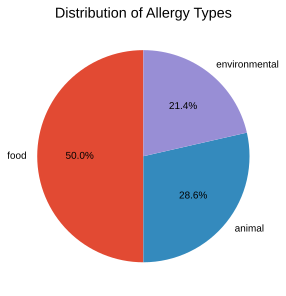

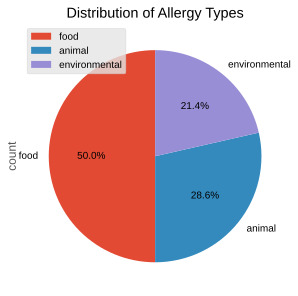

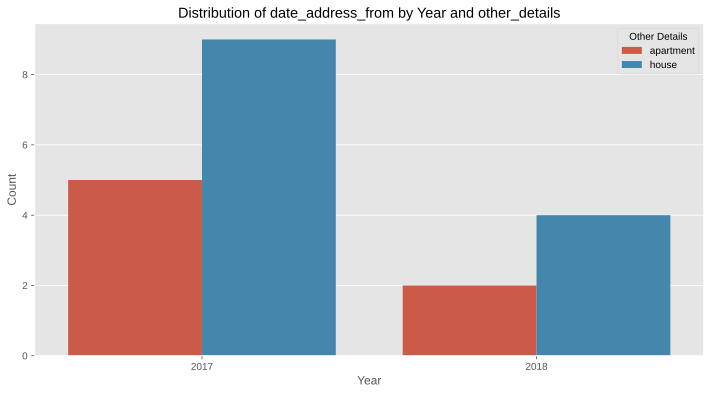

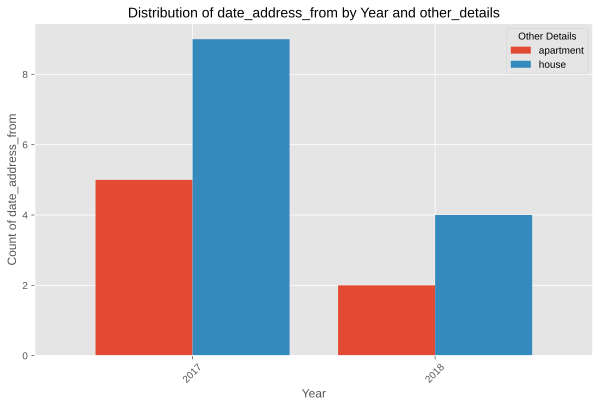

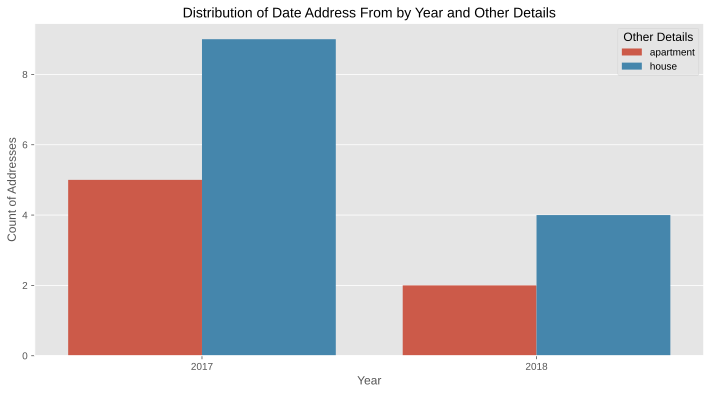

...

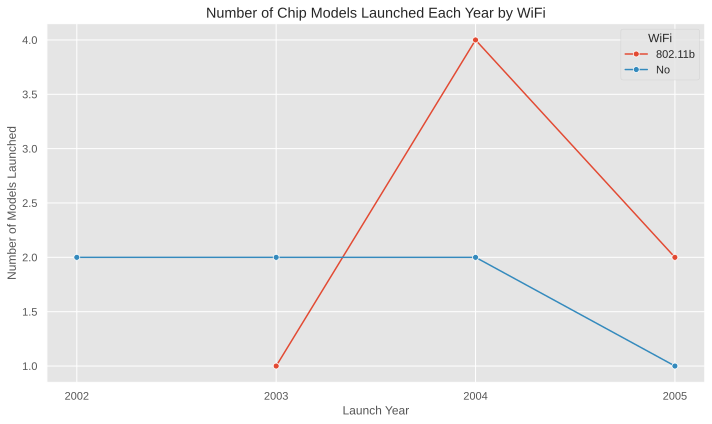

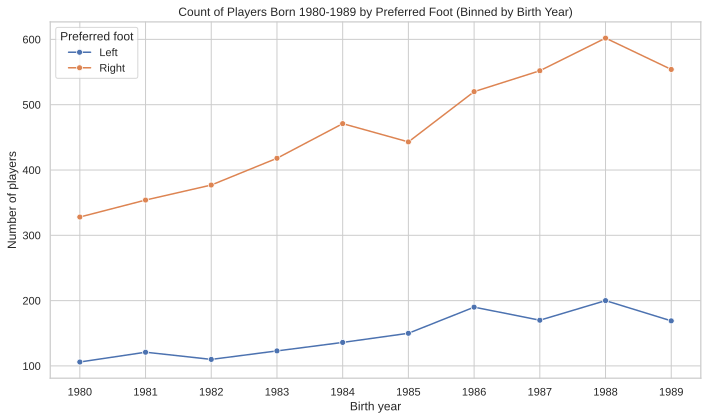

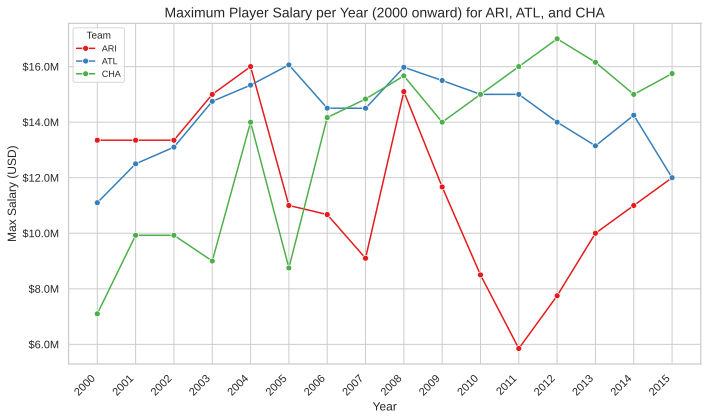

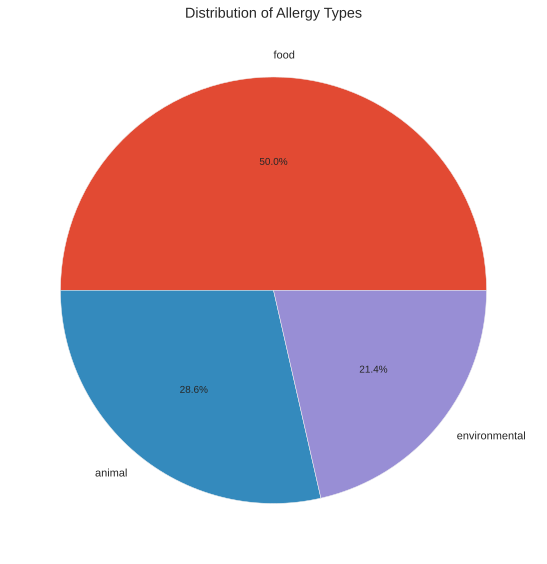

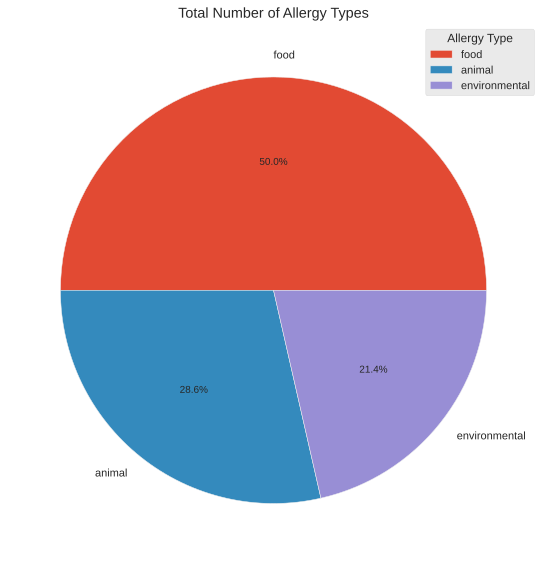

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 800x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

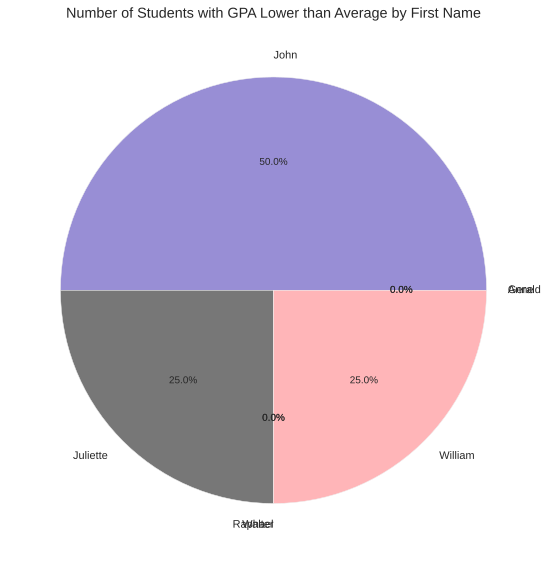

<Figure size 1000x600 with 0 Axes>

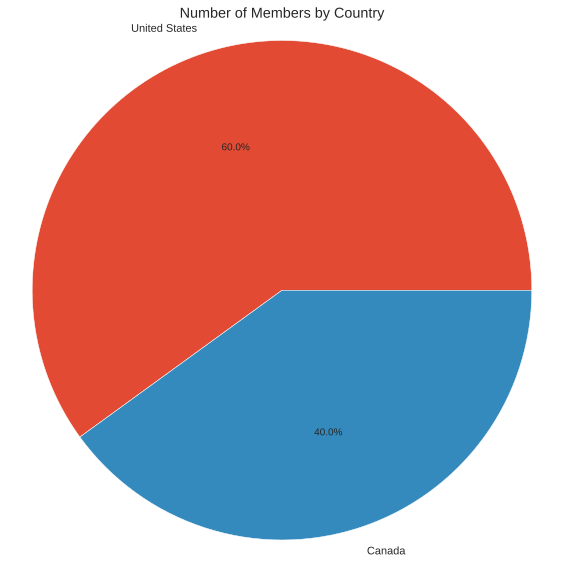

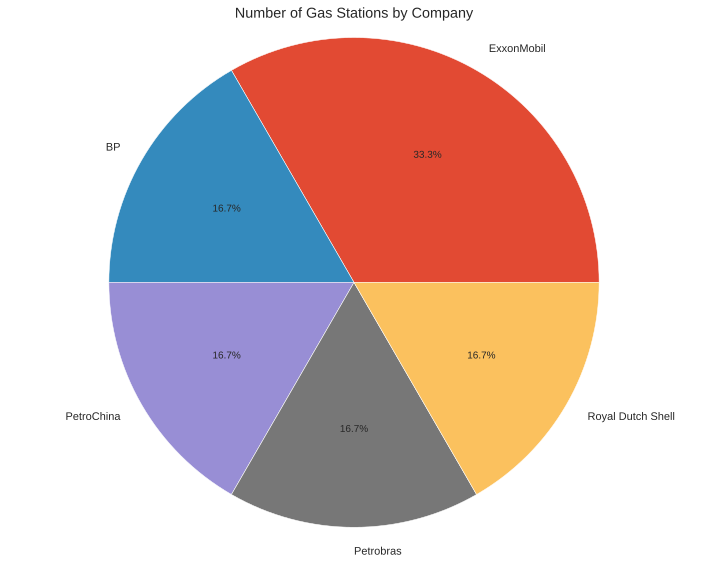

<Figure size 1000x600 with 0 Axes>

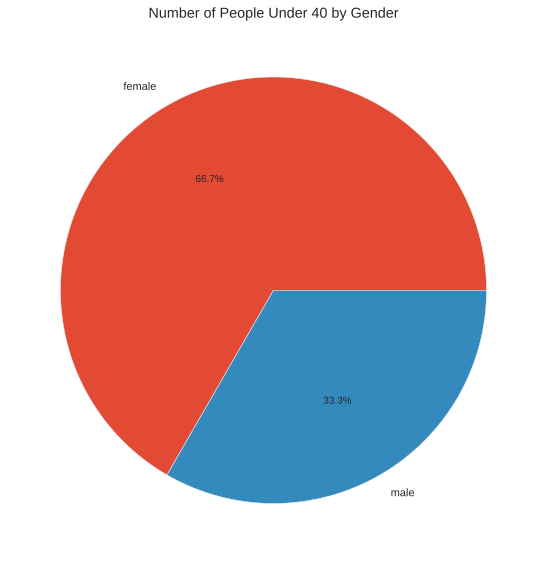

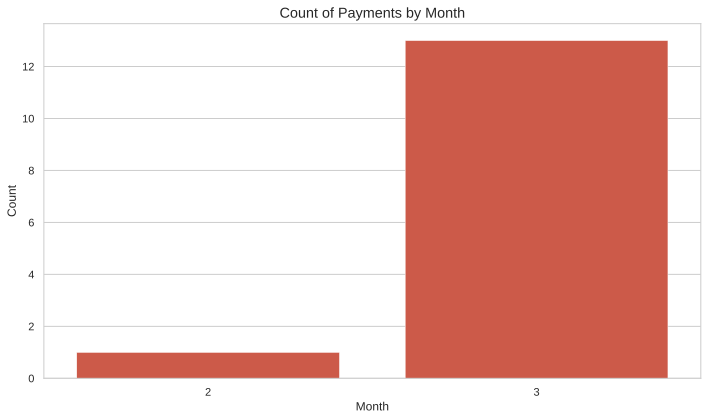

<Figure size 1000x600 with 0 Axes>

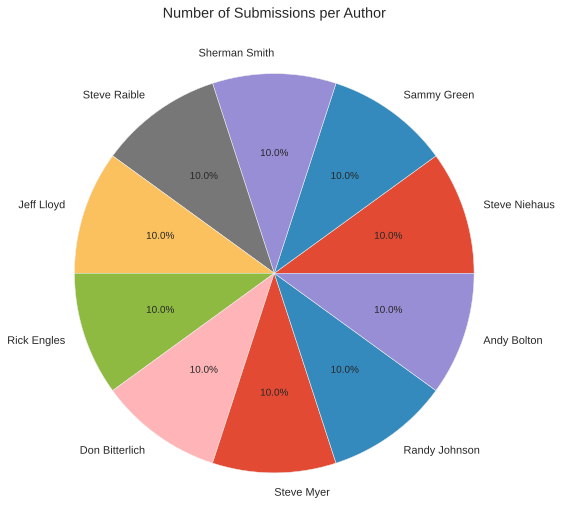

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

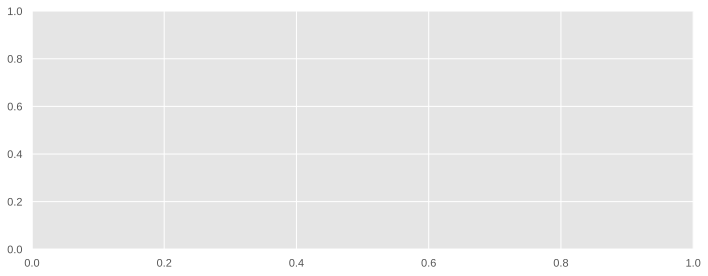

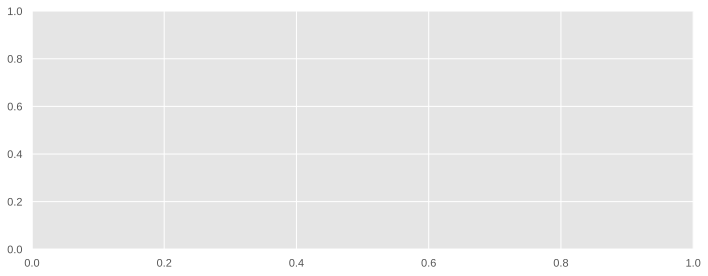

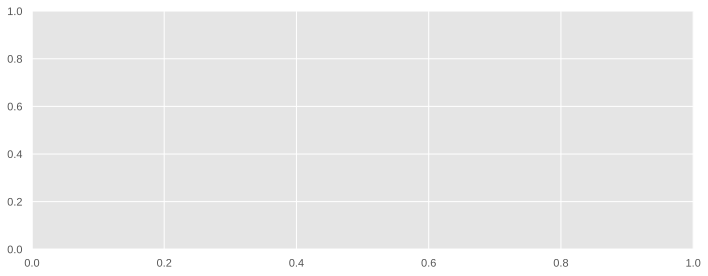

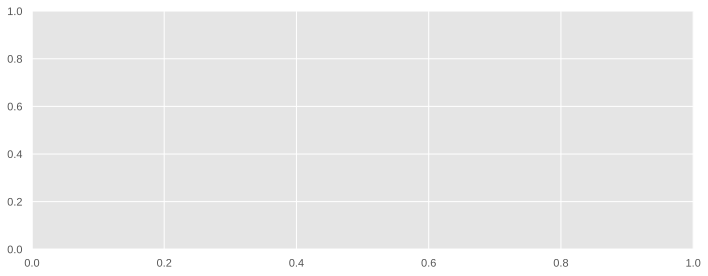

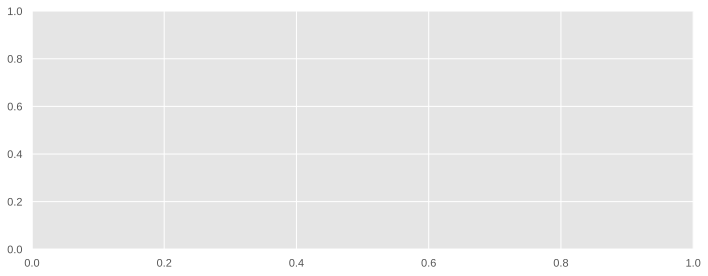

...

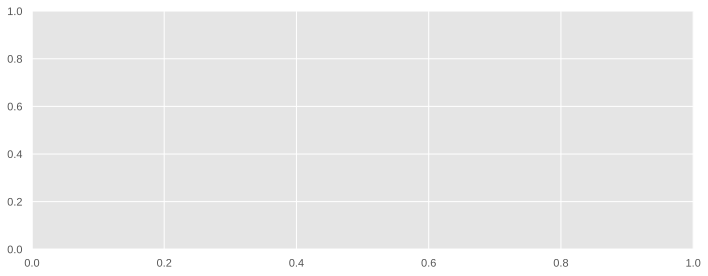

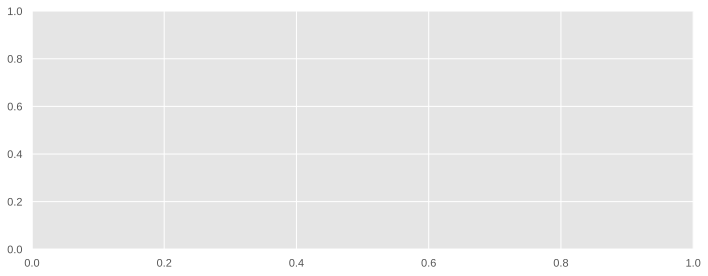

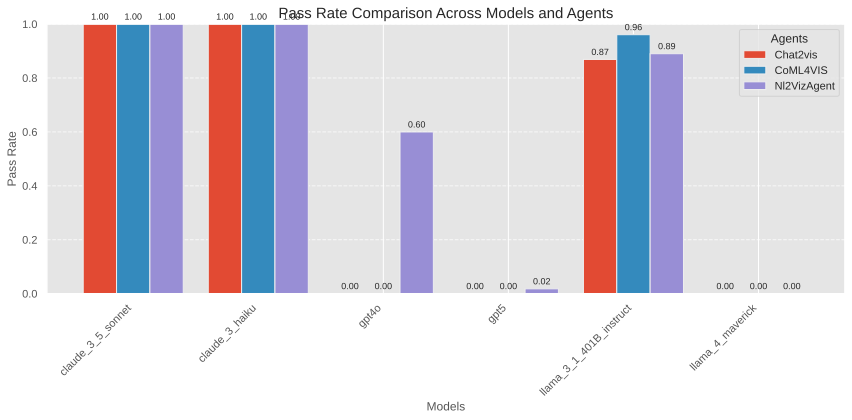

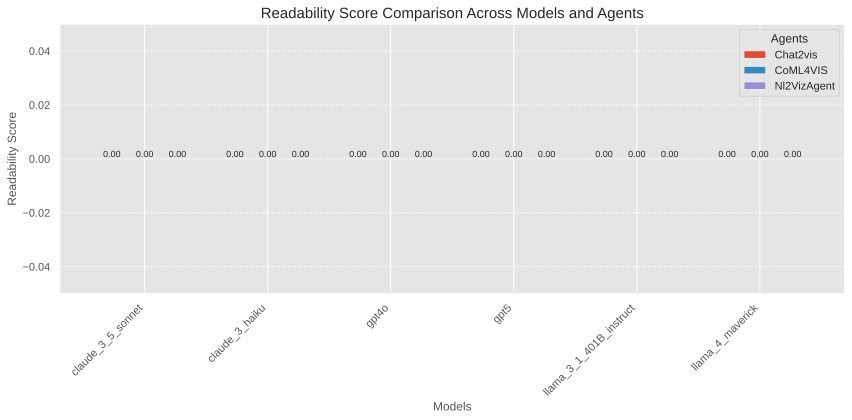

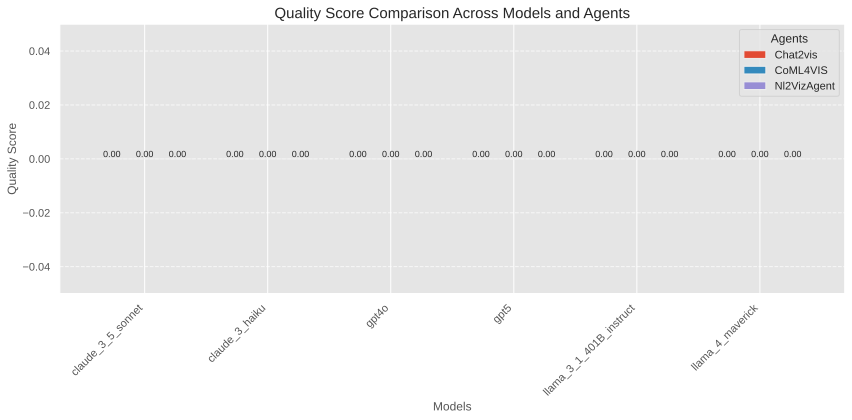

In [ ]:
# Configuration
chromedriver_path = settings.CHROME_DRIVER_PATH

agents = ['Nl2VizAgent', 'CoML4VIS', 'Chat2vis']
model_names = ['gpt4o', 'gpt5',  'claude_3_5_sonnet', 'claude_3_haiku', 'llama_3_1_401B_instruct', 'llama_4_maverick'] 
libraries = ['matplotlib', 'seaborn']

# specific_ids = utils.get_equal_samples(viseval_json_path=settings.VISEVAL_JSON_PATH, num_samples=5)
specific_ids = ['4034', '707', '2633', '3262', '4035', '1166@y_name@ASC', '1129', '2845@y_name@ASC', '2781', '46', '2615', '4022', '1807', '1515', '354', '1795@x_name@DESC', '1326', '2280', '642@x_name@DESC', '1973', '4021', '591', '1285', '2755@x_name@DESC', '4029', '921@y_name@DESC', '196', '2165@y_name@DESC', '2709', '517', '2464', '1971', '682@x_name@ASC', '296', '387', '1090', '1375@x_name@ASC', '803', '1012', '2958', '403', '789', '753@x_name@DESC', '4026', '1963@y_name@DESC', '3227', '997@x_name@DESC', '1241', '1972', '2028@y_name@DESC', '1079', '3097', '522@y_name@DESC', '544@x_name@DESC', '920@y_name@ASC', '1621']

specific_ids_add_on = ['1621']
specific_ids = specific_ids + specific_ids_add_on
print('IDS:', specific_ids)
print("Total samples: ", len(specific_ids))

results = []
detail_results = pd.DataFrame()
# Run evaluation for each agent and model combination
for agent_name in tqdm(agents, desc="Agents"):
    for model_name in tqdm(model_names, desc="Models"):
        for library in tqdm(libraries, desc="Libraries"):
            # with utils.suppress_output():
            detail_records = evaluate_agent_with_model(agent_name=agent_name,
                                                        library=library,
                                                    model_name=model_name, 
                                                    dataset_folder=dataset_path,
                                                    chromedriver_path=chromedriver_path,
                                                results_list=results,
                                                specific_ids=specific_ids)
            detail_records['library'] = library
            detail_records['agent'] = agent_name
            detail_records['model'] = model_name
            
            detail_results = pd.concat([detail_results, detail_records], ignore_index=True)
            utils.remove_svg_files()
            utils.remove_logs_folder()

timestamp = datetime.datetime.now().strftime("%Y%m%d")
results = pd.DataFrame(results)
detail_results.to_excel(f'output/detail_records_{timestamp}_{len(specific_ids)}samples.xlsx', index=False)
results.to_excel(f"output/evaluation_results_{timestamp}_{len(specific_ids)}samples.xlsx", index=False)

utils.metric_visual(results_df=results, metric='pass_rate')
utils.metric_visual(results_df=results, metric='readability_score')
utils.metric_visual(results_df=results, metric='quality_score')

In [1]:
import pandas as pd
from utils import error_rate_visualization, performance_comparison_plot, performance_heatmap
# Load the uploaded Excel file
file_path = "/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Evaluation Metrics.xlsx"
df = pd.read_excel(file_path, sheet_name='Modified')
df = df[df['library']=='seaborn']  # Filter for SEABORN library
performance_heatmap(df)

In [19]:
df[['agent', 'model', 'pass_rate', 'readability_score', 'quality_score']]

,agent,model,pass_rate,readability_score,quality_score
1,Nl2VizAgent,gpt4o,0.729,0.846,0.676
3,Nl2VizAgent,gpt5,0.727,0.804,0.736
5,Nl2VizAgent,claude_3_5_sonnet,0.706,0.836,0.913
7,Nl2VizAgent,claude_3_haiku,0.705,0.920,0.674
9,Nl2VizAgent,llama_3_1_401B_instruct,0.700,0.759,0.811
11,Nl2VizAgent,llama_4_maverick,0.703,0.903,0.676
13,CoML4VIS,gpt4o,0.654,0.744,0.845
15,CoML4VIS,gpt5,0.653,0.879,0.872
17,CoML4VIS,claude_3_5_sonnet,0.654,0.684,0.906
19,CoML4VIS,claude_3_haiku,0.679,0.718,0.647


In [20]:
import pandas as pd
from utils import error_rate_visualization, performance_comparison_plot, performance_heatmap
# Load the uploaded Excel file
file_path = "/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/src/Seaborn_Agent_Evaluation_Scores_with__10__Variation.csv"
df = pd.read_csv(file_path)
performance_heatmap(df)

In [6]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_excel("/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Evaluation Metrics.xlsx")

# --- Custom Colors & Fonts ---
agent_colors = {
    "Nl2VizAgent": "#A6CEE3",   # Light Sky Blue
    "CoML4VIS": "#FDBF6F",      # Soft Amber
    "Chat2vis": "#C8E6C9"       # Light Mint Green
}

title_font = "Raleway, sans-serif"
text_font = "Open Sans, sans-serif"

# --- Smart label placement ---
df = df.copy()
df["text_pos"] = df["pass_rate"].apply(lambda x: "inside" if x > 0.7 else "outside")

# --- Combined Visualization (vertical facets) ---
fig = px.bar(
    df,
    x="model",
    y="pass_rate",
    color="agent",
    barmode="group",
    facet_row="library",      # ✅ vertical layout
    facet_row_spacing=0.12,
    title="<b>Pass Rate Comparison by Model, Agent, and Library</b>",
    text="pass_rate",
    color_discrete_map=agent_colors,
)

# --- Dynamic text positioning ---
for trace in fig.data:
    agent_name = trace.name
    trace_text_positions = [
        df[df["agent"] == agent_name]["text_pos"].values[i]
        if i < len(df[df["agent"] == agent_name])
        else "outside"
        for i in range(len(trace.y))
    ]
    trace.textposition = trace_text_positions

# --- Clean bar appearance ---
fig.update_traces(
    texttemplate='%{text:.2f}',
    marker_line_width=0,
    textfont=dict(size=16)
)

# ✅ Gridlines visible
fig.update_yaxes(showgrid=True, gridcolor='rgba(220,220,220,0.4)', zeroline=False)
fig.update_xaxes(showgrid=True, gridcolor='rgba(220,220,220,0.4)')

# --- Remove default facet labels ---
for annotation in fig.layout.annotations:
    annotation.text = ""

# --- Unified Layout Styling ---
fig.update_layout(
    # --- Title ---
    title=dict(
        text="<b>Pass Rate Comparison by Model, Agent, and Library</b>",
        x=0.5,
        y=0.95,
        xanchor='center',
        font=dict(size=24, family=title_font, color="#222222")
    ),

    # --- Font Defaults ---
    font=dict(family=text_font, size=13, color="#333"),

    # --- Dimensions & Margins ---
    width=1200,
    height=900,
    margin=dict(l=40, r=40, t=100, b=80),

    # --- Axes ---
    xaxis=dict(
        title="Model",
        title_font=dict(family=text_font, size=16),
        tickfont=dict(family=text_font, size=16),
        gridcolor='rgba(220,220,220,0.4)',
        tickangle=-30
    ),
    yaxis=dict(
        title="Pass Rate",
        title_font=dict(family=text_font, size=16),
        tickfont=dict(family=text_font, size=16),
        gridcolor='rgba(220,220,220,0.4)'
    ),

    # --- Colors & Background ---
    plot_bgcolor='rgba(255,255,255,1)',
    paper_bgcolor='rgba(255,255,255,1)',

    # --- Legend ---
    legend=dict(
        title="Agent",
        orientation="h",
        yanchor="top",
        y=-0.25,
        xanchor="center",
        x=0.5,
        bgcolor='rgba(255,255,255,0)',
        bordercolor='rgba(220,220,220,0.4)',
        borderwidth=1,
        title_font=dict(family=text_font, size=16),
        font=dict(family=text_font, size=16)
    ),

    bargap=0.3,
)

# --- Add centered facet titles ---
facet_titles = df["library"].str.title().unique()
facet_positions = [1.05, 0.47]  # Adjust vertical positions for 2 subplots (tweak if more)

for i, lib_name in enumerate(facet_titles):
    fig.add_annotation(
        text=f"<b>{lib_name}</b>",
        x=0.5,
        y=facet_positions[i],
        xref="paper",
        yref="paper",
        showarrow=False,
        font=dict(size=20, family=title_font, color="#333"),
    )

fig.show()


In [7]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_excel("/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Evaluation Metrics.xlsx")

# --- Custom Colors & Fonts ---
agent_colors = {
    "Nl2VizAgent": "#A6CEE3",   # Light Sky Blue
    "CoML4VIS": "#FDBF6F",      # Soft Amber
    "Chat2vis": "#C8E6C9"       # Light Mint Green
}

title_font = "Raleway, sans-serif"
text_font = "Open Sans, sans-serif"

# --- Smart label placement ---
df = df.copy()
df["text_pos"] = df["pass_rate"].apply(lambda x: "inside" if x > 0.7 else "outside")

# --- Combined Visualization (vertical facets) ---
fig = px.bar(
    df,
    x="model",
    y="pass_rate",
    color="agent",
    barmode="group",
    facet_row="library",      # ✅ vertical layout
    facet_row_spacing=0.12,
    title="<b>Pass Rate Comparison by Model, Agent, and Library</b>",
    text="pass_rate",
    color_discrete_map=agent_colors,
)

# --- Dynamic text positioning ---
for trace in fig.data:
    agent_name = trace.name
    trace_text_positions = [
        df[df["agent"] == agent_name]["text_pos"].values[i]
        if i < len(df[df["agent"] == agent_name])
        else "outside"
        for i in range(len(trace.y))
    ]
    trace.textposition = trace_text_positions

# --- Clean bar appearance ---
fig.update_traces(
    texttemplate='%{text:.2f}',
    marker_line_width=0,
    textfont=dict(size=16)  # ✅ consistent label font
)

# ✅ Gridlines visible
fig.update_yaxes(showgrid=True, gridcolor='rgba(220,220,220,0.4)', zeroline=False)
fig.update_xaxes(showgrid=True, gridcolor='rgba(220,220,220,0.4)')

# --- Remove default facet labels ---
for annotation in fig.layout.annotations:
    annotation.text = ""

# --- Unified Layout Styling (Consistent font sizes) ---
fig.update_layout(
    # --- Title ---
    title=dict(
        text="<b>Pass Rate Comparison by Model, Agent, and Library</b>",
        x=0.5,
        y=0.97,
        xanchor='center',
        font=dict(size=24, family=title_font, color="#222222")
    ),

    # --- Font Defaults ---
    font=dict(family=text_font, size=16, color="#333"),  # ✅ unified base font

    # --- Dimensions & Margins ---
    width=1200,
    height=900,
    margin=dict(l=60, r=60, t=100, b=80),

    # --- Axes ---
    xaxis=dict(
        title="Model",
        title_font=dict(family=text_font, size=18),
        tickfont=dict(family=text_font, size=16),
        gridcolor='rgba(220,220,220,0.4)',
        tickangle=-30
    ),
    yaxis=dict(
        title="Pass Rate",
        title_font=dict(family=text_font, size=18),
        tickfont=dict(family=text_font, size=16),
        gridcolor='rgba(220,220,220,0.4)'
    ),

    # --- Colors & Background ---
    plot_bgcolor='rgba(255,255,255,1)',
    paper_bgcolor='rgba(255,255,255,1)',

    # --- Legend ---
    legend=dict(
        title="Agent",
        orientation="h",
        yanchor="top",
        y=-0.25,
        xanchor="center",
        x=0.5,
        bgcolor='rgba(255,255,255,0)',
        bordercolor='rgba(220,220,220,0.4)',
        borderwidth=1,
        title_font=dict(family=text_font, size=16),
        font=dict(family=text_font, size=16)
    ),

    bargap=0.3,
)

# --- Add centered facet titles ---
facet_titles = df["library"].str.title().unique()
facet_positions = [1.05, 0.47]  # Adjust vertical positions for 2 subplots

for i, lib_name in enumerate(facet_titles):
    fig.add_annotation(
        text=f"<b>{lib_name}</b>",
        x=0.5,
        y=facet_positions[i],
        xref="paper",
        yref="paper",
        showarrow=False,
        font=dict(size=20, family=title_font, color="#333"),  # ✅ consistent facet title font
    )

fig.show()


In [3]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_excel("/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Metrics.xlsx")

# --- Custom Colors & Fonts ---
agent_colors = {
    "Nl2VizAgent": "#A6CEE3",   # Light Sky Blue
    "CoML4VIS": "#FDBF6F",      # Soft Amber
    "Chat2vis": "#C8E6C9"       # Light Mint Green
}

title_font = "Raleway, sans-serif"
text_font = "Open Sans, sans-serif"

# --- Smart label placement ---
df = df.copy()
df["text_pos"] = df["pass_rate"].apply(lambda x: "inside" if x > 0.7 else "outside")

# --- Combined Visualization (vertical facets) ---
fig = px.bar(
    df,
    x="model",
    y="pass_rate",
    color="agent",
    barmode="group",
    facet_row="library",      # ✅ vertical layout
    facet_row_spacing=0.12,
    title="<b>Pass Rate Comparison by Model, Agent, and Library</b>",
    text="pass_rate",
    color_discrete_map=agent_colors,
)

# --- Dynamic text positioning ---
for trace in fig.data:
    agent_name = trace.name
    trace_text_positions = [
        df[df["agent"] == agent_name]["text_pos"].values[i]
        if i < len(df[df["agent"] == agent_name])
        else "outside"
        for i in range(len(trace.y))
    ]
    trace.textposition = trace_text_positions

# --- Clean bar appearance (no border, no center lines) ---
fig.update_traces(
    texttemplate='%{text:.2f}',
    marker_line_width=0,
    textfont=dict(size=12)
)

# ✅ Gridlines visible
fig.update_yaxes(showgrid=True, gridcolor='lightgrey', zeroline=False)
fig.update_xaxes(showgrid=True, gridcolor='lightgrey')

# --- Remove facet default labels (vertical) ---
for annotation in fig.layout.annotations:
    annotation.text = ""

# --- Layout Styling ---
fig.update_layout(
    height=950,
    bargap=0.3,          # ✅ Space *between* model groups
    # bargroupgap=0.1,      # ✅ Small space *between* agent bars within same model
    title=dict(
        x=0.5,
        xanchor="center",
        font=dict(size=26, family=title_font, color="#333")
    ),
    font=dict(family=text_font, size=13),
    xaxis_title="Model",
    yaxis_title="pass_rate",
    xaxis_tickangle=-30,
    plot_bgcolor="white",
    paper_bgcolor="white",
    legend_title="Agent",
    legend=dict(
        orientation="h",
        yanchor="top",
        y=-0.25,
        xanchor="center",
        x=0.5,
        bgcolor='rgba(255,255,255,0)',
    ),
    margin=dict(t=120, b=130, l=60, r=40)
)


# --- Add centered horizontal facet titles ---
facet_titles = df["library"].str.title().unique()
facet_positions = [1.05, 0.47]  # adjust vertical positions for two subplots

for i, lib_name in enumerate(facet_titles):
    fig.add_annotation(
        text=f"<b>{lib_name}</b>",
        x=0.5,  # center horizontally
        y=facet_positions[i],
        xref="paper",
        yref="paper",
        showarrow=False,
        font=dict(size=20, family=title_font, color="#333"),
    )

fig.show()


FileNotFoundError: [Errno 2] No such file or directory: '/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Metrics.xlsx'

In [ ]:
from tkinter import font
import pandas as pd
import plotly.express as px
file_path = '/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Evaluation Metrics.xlsx'
df = pd.read_excel(file_path)

# --- Figure 1 ---
fig_pairwise = px.scatter(
    df[df["agent"] == "Nl2VizAgent"],
    x="readability_score",
    y="quality_score",
    color="pass_rate",
    symbol="model",
    size="quality_score",
    facet_col="library",
    hover_data=["model", "invalid_rate", "illegal_rate"],
    title="Relationship between Readability, Quality, and Pass Rate (Nl2VizAgent)",
    labels={
        "readability_score": "Readability Score",
        "quality_score": "Quality Score",
        "pass_rate": "Pass Rate"
    },
    color_continuous_scale="Viridis"
)


fig_pairwise.update_traces(marker=dict(opacity=0.85, line=dict(width=0.5, color="black")))
fig_pairwise.update_layout(legend=dict(orientation="h", y=-0.2))
fig_pairwise.show()

# fig.update_layout(
#     title_font_size=20,
#     title_font_family=title_font,
#     title_font_color="#222222",  # Slightly darker for better contrast on white
#     title_x=0.5,
#     title={
#         'text': f"<b>{title}</b>",
#         'y': 0.95,
#         'xanchor': 'center'
#     },
#     legend_title_font_size=16,
#     legend_title_font_family=text_font,
#     font_family=text_font,
#     width=1200,
#     height=800,
#     margin=dict(l=40, r=40, t=80, b=40),
#     xaxis=dict(
#         title_font=dict(family=text_font, size=16),
#         tickfont=dict(family=text_font, size=16),
#         gridcolor='rgba(220,220,220,0.4)'  # Lighter grid lines
#     ),
#     yaxis=dict(
#         title_font=dict(family=text_font, size=16),
#         tickfont=dict(family=text_font, size=16),
#         gridcolor='rgba(220,220,220,0.4)'  # Lighter grid lines
#     ),
#     # Add subtle box around plot area
#     plot_bgcolor='rgba(255,255,255,1)',
#     paper_bgcolor='rgba(255,255,255,1)',
#     legend=dict(
#         bordercolor='rgba(220,220,220,0.4)',
#         borderwidth=1
#     )
# )

ValueError: Invalid property specified for object of type plotly.graph_objs.Scatter: 'font'

Did you mean "fill"?

    Valid properties:
        alignmentgroup
            Set several traces linked to the same position axis or
            matching axes to the same alignmentgroup. This controls
            whether bars compute their positional range dependently
            or independently.
        cliponaxis
            Determines whether or not markers and text nodes are
            clipped about the subplot axes. To show markers and
            text nodes above axis lines and tick labels, make sure
            to set `xaxis.layer` and `yaxis.layer` to *below
            traces*.
        connectgaps
            Determines whether or not gaps (i.e. {nan} or missing
            values) in the provided data arrays are connected.
        customdata
            Assigns extra data each datum. This may be useful when
            listening to hover, click and selection events. Note
            that, "scatter" traces also appends customdata items in
            the markers DOM elements
        customdatasrc
            Sets the source reference on Chart Studio Cloud for
            `customdata`.
        dx
            Sets the x coordinate step. See `x0` for more info.
        dy
            Sets the y coordinate step. See `y0` for more info.
        error_x
            :class:`plotly.graph_objects.scatter.ErrorX` instance
            or dict with compatible properties
        error_y
            :class:`plotly.graph_objects.scatter.ErrorY` instance
            or dict with compatible properties
        fill
            Sets the area to fill with a solid color. Defaults to
            "none" unless this trace is stacked, then it gets
            "tonexty" ("tonextx") if `orientation` is "v" ("h") Use
            with `fillcolor` if not "none". "tozerox" and "tozeroy"
            fill to x=0 and y=0 respectively. "tonextx" and
            "tonexty" fill between the endpoints of this trace and
            the endpoints of the trace before it, connecting those
            endpoints with straight lines (to make a stacked area
            graph); if there is no trace before it, they behave
            like "tozerox" and "tozeroy". "toself" connects the
            endpoints of the trace (or each segment of the trace if
            it has gaps) into a closed shape. "tonext" fills the
            space between two traces if one completely encloses the
            other (eg consecutive contour lines), and behaves like
            "toself" if there is no trace before it. "tonext"
            should not be used if one trace does not enclose the
            other. Traces in a `stackgroup` will only fill to (or
            be filled to) other traces in the same group. With
            multiple `stackgroup`s or some traces stacked and some
            not, if fill-linked traces are not already consecutive,
            the later ones will be pushed down in the drawing
            order.
        fillcolor
            Sets the fill color. Defaults to a half-transparent
            variant of the line color, marker color, or marker line
            color, whichever is available. If fillgradient is
            specified, fillcolor is ignored except for setting the
            background color of the hover label, if any.
        fillgradient
            Sets a fill gradient. If not specified, the fillcolor
            is used instead.
        fillpattern
            Sets the pattern within the marker.
        groupnorm
            Only relevant when `stackgroup` is used, and only the
            first `groupnorm` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Sets the normalization for the sum of
            this `stackgroup`. With "fraction", the value of each
            trace at each location is divided by the sum of all
            trace values at that location. "percent" is the same
            but multiplied by 100 to show percentages. If there are
            multiple subplots, or multiple `stackgroup`s on one
            subplot, each will be normalized within its own set.
        hoverinfo
            Determines which trace information appear on hover. If
            `none` or `skip` are set, no information is displayed
            upon hovering. But, if `none` is set, click and hover
            events are still fired.
        hoverinfosrc
            Sets the source reference on Chart Studio Cloud for
            `hoverinfo`.
        hoverlabel
            :class:`plotly.graph_objects.scatter.Hoverlabel`
            instance or dict with compatible properties
        hoveron
            Do the hover effects highlight individual points
            (markers or line points) or do they highlight filled
            regions? If the fill is "toself" or "tonext" and there
            are no markers or text, then the default is "fills",
            otherwise it is "points".
        hovertemplate
            Template string used for rendering the information that
            appear on hover box. Note that this will override
            `hoverinfo`. Variables are inserted using %{variable},
            for example "y: %{y}" as well as %{xother}, {%_xother},
            {%_xother_}, {%xother_}. When showing info for several
            points, "xother" will be added to those with different
            x positions from the first point. An underscore before
            or after "(x|y)other" will add a space on that side,
            only when this field is shown. Numbers are formatted
            using d3-format's syntax %{variable:d3-format}, for
            example "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. The variables available in
            `hovertemplate` are the ones emitted as event data
            described at this link
            https://plotly.com/javascript/plotlyjs-events/#event-
            data. Additionally, every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.  Anything contained in tag `<extra>` is
            displayed in the secondary box, for example
            `<extra>%{fullData.name}</extra>`. To hide the
            secondary box completely, use an empty tag
            `<extra></extra>`.
        hovertemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `hovertemplate`.
        hovertext
            Sets hover text elements associated with each (x,y)
            pair. If a single string, the same string appears over
            all the data points. If an array of string, the items
            are mapped in order to the this trace's (x,y)
            coordinates. To be seen, trace `hoverinfo` must contain
            a "text" flag.
        hovertextsrc
            Sets the source reference on Chart Studio Cloud for
            `hovertext`.
        ids
            Assigns id labels to each datum. These ids for object
            constancy of data points during animation. Should be an
            array of strings, not numbers or any other type.
        idssrc
            Sets the source reference on Chart Studio Cloud for
            `ids`.
        legend
            Sets the reference to a legend to show this trace in.
            References to these legends are "legend", "legend2",
            "legend3", etc. Settings for these legends are set in
            the layout, under `layout.legend`, `layout.legend2`,
            etc.
        legendgroup
            Sets the legend group for this trace. Traces and shapes
            part of the same legend group hide/show at the same
            time when toggling legend items.
        legendgrouptitle
            :class:`plotly.graph_objects.scatter.Legendgrouptitle`
            instance or dict with compatible properties
        legendrank
            Sets the legend rank for this trace. Items and groups
            with smaller ranks are presented on top/left side while
            with "reversed" `legend.traceorder` they are on
            bottom/right side. The default legendrank is 1000, so
            that you can use ranks less than 1000 to place certain
            items before all unranked items, and ranks greater than
            1000 to go after all unranked items. When having
            unranked or equal rank items shapes would be displayed
            after traces i.e. according to their order in data and
            layout.
        legendwidth
            Sets the width (in px or fraction) of the legend for
            this trace.
        line
            :class:`plotly.graph_objects.scatter.Line` instance or
            dict with compatible properties
        marker
            :class:`plotly.graph_objects.scatter.Marker` instance
            or dict with compatible properties
        meta
            Assigns extra meta information associated with this
            trace that can be used in various text attributes.
            Attributes such as trace `name`, graph, axis and
            colorbar `title.text`, annotation `text`
            `rangeselector`, `updatemenues` and `sliders` `label`
            text all support `meta`. To access the trace `meta`
            values in an attribute in the same trace, simply use
            `%{meta[i]}` where `i` is the index or key of the
            `meta` item in question. To access trace `meta` in
            layout attributes, use `%{data[n[.meta[i]}` where `i`
            is the index or key of the `meta` and `n` is the trace
            index.
        metasrc
            Sets the source reference on Chart Studio Cloud for
            `meta`.
        mode
            Determines the drawing mode for this scatter trace. If
            the provided `mode` includes "text" then the `text`
            elements appear at the coordinates. Otherwise, the
            `text` elements appear on hover. If there are less than
            20 points and the trace is not stacked then the default
            is "lines+markers". Otherwise, "lines".
        name
            Sets the trace name. The trace name appears as the
            legend item and on hover.
        offsetgroup
            Set several traces linked to the same position axis or
            matching axes to the same offsetgroup where bars of the
            same position coordinate will line up.
        opacity
            Sets the opacity of the trace.
        orientation
            Only relevant in the following cases: 1. when
            `scattermode` is set to "group". 2. when `stackgroup`
            is used, and only the first `orientation` found in the
            `stackgroup` will be used - including if `visible` is
            "legendonly" but not if it is `false`. Sets the
            stacking direction. With "v" ("h"), the y (x) values of
            subsequent traces are added. Also affects the default
            value of `fill`.
        selected
            :class:`plotly.graph_objects.scatter.Selected` instance
            or dict with compatible properties
        selectedpoints
            Array containing integer indices of selected points.
            Has an effect only for traces that support selections.
            Note that an empty array means an empty selection where
            the `unselected` are turned on for all points, whereas,
            any other non-array values means no selection all where
            the `selected` and `unselected` styles have no effect.
        showlegend
            Determines whether or not an item corresponding to this
            trace is shown in the legend.
        stackgaps
            Only relevant when `stackgroup` is used, and only the
            first `stackgaps` found in the `stackgroup` will be
            used - including if `visible` is "legendonly" but not
            if it is `false`. Determines how we handle locations at
            which other traces in this group have data but this one
            does not. With *infer zero* we insert a zero at these
            locations. With "interpolate" we linearly interpolate
            between existing values, and extrapolate a constant
            beyond the existing values.
        stackgroup
            Set several scatter traces (on the same subplot) to the
            same stackgroup in order to add their y values (or
            their x values if `orientation` is "h"). If blank or
            omitted this trace will not be stacked. Stacking also
            turns `fill` on by default, using "tonexty" ("tonextx")
            if `orientation` is "h" ("v") and sets the default
            `mode` to "lines" irrespective of point count. You can
            only stack on a numeric (linear or log) axis. Traces in
            a `stackgroup` will only fill to (or be filled to)
            other traces in the same group. With multiple
            `stackgroup`s or some traces stacked and some not, if
            fill-linked traces are not already consecutive, the
            later ones will be pushed down in the drawing order.
        stream
            :class:`plotly.graph_objects.scatter.Stream` instance
            or dict with compatible properties
        text
            Sets text elements associated with each (x,y) pair. If
            a single string, the same string appears over all the
            data points. If an array of string, the items are
            mapped in order to the this trace's (x,y) coordinates.
            If trace `hoverinfo` contains a "text" flag and
            "hovertext" is not set, these elements will be seen in
            the hover labels.
        textfont
            Sets the text font.
        textposition
            Sets the positions of the `text` elements with respects
            to the (x,y) coordinates.
        textpositionsrc
            Sets the source reference on Chart Studio Cloud for
            `textposition`.
        textsrc
            Sets the source reference on Chart Studio Cloud for
            `text`.
        texttemplate
            Template string used for rendering the information text
            that appear on points. Note that this will override
            `textinfo`. Variables are inserted using %{variable},
            for example "y: %{y}". Numbers are formatted using
            d3-format's syntax %{variable:d3-format}, for example
            "Price: %{y:$.2f}".
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format
            for details on the formatting syntax. Dates are
            formatted using d3-time-format's syntax
            %{variable|d3-time-format}, for example "Day:
            %{2019-01-01|%A}". https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format for details on the
            date formatting syntax. Every attributes that can be
            specified per-point (the ones that are `arrayOk: true`)
            are available.
        texttemplatesrc
            Sets the source reference on Chart Studio Cloud for
            `texttemplate`.
        uid
            Assign an id to this trace, Use this to provide object
            constancy between traces during animations and
            transitions.
        uirevision
            Controls persistence of some user-driven changes to the
            trace: `constraintrange` in `parcoords` traces, as well
            as some `editable: true` modifications such as `name`
            and `colorbar.title`. Defaults to `layout.uirevision`.
            Note that other user-driven trace attribute changes are
            controlled by `layout` attributes: `trace.visible` is
            controlled by `layout.legend.uirevision`,
            `selectedpoints` is controlled by
            `layout.selectionrevision`, and `colorbar.(x|y)`
            (accessible with `config: {editable: true}`) is
            controlled by `layout.editrevision`. Trace changes are
            tracked by `uid`, which only falls back on trace index
            if no `uid` is provided. So if your app can add/remove
            traces before the end of the `data` array, such that
            the same trace has a different index, you can still
            preserve user-driven changes if you give each trace a
            `uid` that stays with it as it moves.
        unselected
            :class:`plotly.graph_objects.scatter.Unselected`
            instance or dict with compatible properties
        visible
            Determines whether or not this trace is visible. If
            "legendonly", the trace is not drawn, but can appear as
            a legend item (provided that the legend itself is
            visible).
        x
            Sets the x coordinates.
        x0
            Alternate to `x`. Builds a linear space of x
            coordinates. Use with `dx` where `x0` is the starting
            coordinate and `dx` the step.
        xaxis
            Sets a reference between this trace's x coordinates and
            a 2D cartesian x axis. If "x" (the default value), the
            x coordinates refer to `layout.xaxis`. If "x2", the x
            coordinates refer to `layout.xaxis2`, and so on.
        xcalendar
            Sets the calendar system to use with `x` date data.
        xhoverformat
            Sets the hover text formatting rulefor `x`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `xaxis.hoverformat`.
        xperiod
            Only relevant when the axis `type` is "date". Sets the
            period positioning in milliseconds or "M<n>" on the x
            axis. Special values in the form of "M<n>" could be
            used to declare the number of months. In this case `n`
            must be a positive integer.
        xperiod0
            Only relevant when the axis `type` is "date". Sets the
            base for period positioning in milliseconds or date
            string on the x0 axis. When `x0period` is round number
            of weeks, the `x0period0` by default would be on a
            Sunday i.e. 2000-01-02, otherwise it would be at
            2000-01-01.
        xperiodalignment
            Only relevant when the axis `type` is "date". Sets the
            alignment of data points on the x axis.
        xsrc
            Sets the source reference on Chart Studio Cloud for
            `x`.
        y
            Sets the y coordinates.
        y0
            Alternate to `y`. Builds a linear space of y
            coordinates. Use with `dy` where `y0` is the starting
            coordinate and `dy` the step.
        yaxis
            Sets a reference between this trace's y coordinates and
            a 2D cartesian y axis. If "y" (the default value), the
            y coordinates refer to `layout.yaxis`. If "y2", the y
            coordinates refer to `layout.yaxis2`, and so on.
        ycalendar
            Sets the calendar system to use with `y` date data.
        yhoverformat
            Sets the hover text formatting rulefor `y`  using d3
            formatting mini-languages which are very similar to
            those in Python. For numbers, see:
            https://github.com/d3/d3-format/tree/v1.4.5#d3-format.
            And for dates see: https://github.com/d3/d3-time-
            format/tree/v2.2.3#locale_format. We add two items to
            d3's date formatter: "%h" for half of the year as a
            decimal number as well as "%{n}f" for fractional
            seconds with n digits. For example, *2016-10-13
            09:15:23.456* with tickformat "%H~%M~%S.%2f" would
            display *09~15~23.46*By default the values are
            formatted using `yaxis.hoverformat`.
        yperiod
            Only relevant when the axis `type` is "date". Sets the
            period positioning in milliseconds or "M<n>" on the y
            axis. Special values in the form of "M<n>" could be
            used to declare the number of months. In this case `n`
            must be a positive integer.
        yperiod0
            Only relevant when the axis `type` is "date". Sets the
            base for period positioning in milliseconds or date
            string on the y0 axis. When `y0period` is round number
            of weeks, the `y0period0` by default would be on a
            Sunday i.e. 2000-01-02, otherwise it would be at
            2000-01-01.
        yperiodalignment
            Only relevant when the axis `type` is "date". Sets the
            alignment of data points on the y axis.
        ysrc
            Sets the source reference on Chart Studio Cloud for
            `y`.
        zorder
            Sets the layer on which this trace is displayed,
            relative to other SVG traces on the same subplot. SVG
            traces with higher `zorder` appear in front of those
            with lower `zorder`.
        
Did you mean "fill"?

Bad property path:
font
^^^^

In [23]:
# from tkinter import font
import pandas as pd
import plotly.express as px

# --- File Path ---
file_path = '/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Evaluation Metrics.xlsx'
df = pd.read_excel(file_path)

# --- Custom Fonts ---
title_font = "Raleway, sans-serif"
text_font = "Arial"

# --- Chart Title ---
title = "Relationship between Readability, Quality, and Pass Rate (Nl2VizAgent)"

# --- Figure 1 ---
fig_pairwise = px.scatter(
    df[df["agent"] == "Nl2VizAgent"],
    x="readability_score",
    y="quality_score",
    color="pass_rate",
    symbol="model",
    size="quality_score",
    facet_col="library",
    hover_data=["model", "invalid_rate", "illegal_rate"],
    title=title,
    labels={
        "readability_score": "Readability Score",
        "quality_score": "Quality Score",
        "pass_rate": "Pass Rate"
    },
    color_continuous_scale="Viridis"
)

# --- Update Marker & Legend ---
fig_pairwise.update_traces(marker=dict(opacity=0.85, line=dict(width=0.5, color="black")))
fig_pairwise.update_layout(legend=dict(orientation="h", y=-0.2))

# --- Enhanced Layout Styling ---
fig_pairwise.update_layout(
    title_font_size=20,
    title_font_family=title_font,
    title_font_color="#222222",
    title_x=0.5,
    title={
        'text': f"<b>{title}</b>",
        'y': 0.95,
        'xanchor': 'center'
    },
    legend_title_font_size=16,
    legend_title_font_family=text_font,
    font_family=text_font,
    width=1200,
    height=600,
    margin=dict(l=40, r=40, t=80, b=40),
    plot_bgcolor='rgba(255,255,255,1)',
    paper_bgcolor='rgba(255,255,255,1)',
    legend=dict(
        bordercolor='rgba(220,220,220,0.4)',
        borderwidth=1,
        orientation="h",     # "v" for vertical, "h" for horizontal
        yanchor="top",    # Anchor legend vertically
        y=-0.2,              # Position above the plot
        xanchor="center",    # Anchor horizontally
        x=0.5,               # Center it
        title_text="Model"   # Optional: explicitly label the legend title
    )
)


# --- ✅ Fix: Force gridlines to appear on ALL facets ---
for axis in fig_pairwise.layout:
    if axis.startswith("xaxis") or axis.startswith("yaxis"):
        fig_pairwise.layout[axis].update(
            showgrid=True,
            gridcolor='rgba(220,220,220,0.4)',
            gridwidth=0.8,
            zeroline=False,
            title_font=dict(family=text_font, size=16),
            tickfont=dict(family=text_font, size=16)
        )

# --- Increase facet column title font size ---
for annotation in fig_pairwise.layout.annotations:
    annotation.font.size = 16   # adjust font size (e.g., 14, 16, 18)
    annotation.font.family = "Arial"  # optional: match your text font
    annotation.font.color = "#222222"  # optional: consistent with title color
    annotation.text = f"<b>{annotation.text}</b>"  # make facet titles bold (optional)

# --- Add light background color for each facet subplot ---
for axis_name in fig_pairwise.layout:
    if axis_name.startswith("xaxis"):
        # get matching yaxis name (e.g., yaxis for xaxis, yaxis2 for xaxis2)
        yaxis_name = "yaxis" + axis_name[5:] if axis_name != "xaxis" else "yaxis"
        xaxis = fig_pairwise.layout[axis_name]
        yaxis = fig_pairwise.layout[yaxis_name]

        # Skip if domain is not defined (some layouts may not have both)
        if hasattr(xaxis, "domain") and hasattr(yaxis, "domain"):
            fig_pairwise.add_shape(
                type="rect",
                xref="paper",
                yref="paper",
                x0=xaxis.domain[0],
                x1=xaxis.domain[1],
                y0=yaxis.domain[0],
                y1=yaxis.domain[1],
                fillcolor="rgba(230, 230, 230, 0.8)",  # Light blue tint (AliceBlue)
                layer="below",
                line_width=0,
            )

# --- Increase gridline thickness and adjust color for all facets ---
for axis_name in fig_pairwise.layout:
    if axis_name.startswith("xaxis") or axis_name.startswith("yaxis"):
        fig_pairwise.layout[axis_name].update(
            showgrid=True,
            gridcolor='rgba(180,180,180,0.6)',  # darker gray gridlines
            gridwidth=0.5,                      # increase thickness
            zeroline=False
        )

# --- Set uniform font size for all text elements ---
fig_pairwise.update_layout(
    font=dict(
        family=text_font,
        size=16,  # applies to axis, legend, hover labels
        color="#222222"
    ),
    xaxis_title_font=dict(size=16, family=text_font),
    yaxis_title_font=dict(size=16, family=text_font),
    legend_font=dict(size=16),
    legend_title_font=dict(size=16)
)

# --- Save the figure with high DPI (600) ---
fig_pairwise.write_image(
    "Nl2VizAgent_Pairwise.png",
    scale=6,  # scale=6 corresponds roughly to 600 DPI for standard 100 DPI base
    width=1200,
    height=600
)


# --- Display ---
fig_pairwise.show()


In [25]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_excel(file_path)

# Focus only on Nl2VizAgent + Matplotlib
df_modelwise = df[(df["agent"] == "Nl2VizAgent") & (df["library"] == "matplotlib")].copy()

# Combine model name and pass_rate for visible labeling
df_modelwise["label"] = df_modelwise.apply(
    lambda x: f"{x['model']} ({x['pass_rate']:.2f})", axis=1
)

# Create scatter: model-wise circles
fig_modelwise = px.scatter(
    df_modelwise,
    x="execution_time",
    y="pass_rate",
    color="model",
    size="quality_score",
    text="label",
    size_max=55,
    title="<b>Model-wise Efficiency: Pass Rate vs Execution Time (Nl2VizAgent - Matplotlib)</b>",
    labels={
        "execution_time": "Execution Time (seconds)",
        "pass_rate": "Pass Rate",
        "model": "Model Type"
    },
    hover_data=["readability_score", "illegal_rate", "invalid_rate"]
)

# Improve label and circle visibility
fig_modelwise.update_traces(
    textposition="middle right",
    textfont=dict(family="Open Sans, sans-serif", size=14, color="black"),
    marker=dict(opacity=0.9, line=dict(width=1.5, color="black"))
)

# Layout improvements + gridline enforcement
fig_modelwise.update_layout(
    title={
        "text": "<b>Model-wise Efficiency: Pass Rate vs Execution Time (Nl2VizAgent - Matplotlib)</b>",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    xaxis=dict(
        title="Execution Time (seconds)",
        showgrid=True,  # ✅ force gridlines visible
        gridwidth=1,
        gridcolor="lightgray",
        zeroline=False
    ),
    yaxis=dict(
        title="Pass Rate",
        showgrid=True,  # ✅ force gridlines visible
        gridwidth=1,
        gridcolor="lightgray",
        zeroline=False,
        range=[df_modelwise["pass_rate"].min() - 0.05, 1.0]
    ),
    plot_bgcolor="white",
    font=dict(family="Open Sans, sans-serif"),
    title_font=dict(family="Raleway, sans-serif", size=20),
    legend=dict(orientation="h", y=-0.25, x=0.3, title="Model"),
    margin=dict(l=70, r=70, t=110, b=90)
)

fig_modelwise.show()


In [26]:
import pandas as pd
import plotly.express as px

# --- Load dataset ---
df = pd.read_excel(file_path)

# --- Filter for Nl2VizAgent + Matplotlib ---
df_modelwise = df[(df["agent"] == "Nl2VizAgent") & (df["library"] == "matplotlib")].copy()

# --- Combine model name and pass_rate for visible labeling ---
df_modelwise["label"] = df_modelwise.apply(
    lambda x: f"{x['model']} ({x['pass_rate']:.2f})", axis=1
)

# --- Create scatter: model-wise circles ---
fig_modelwise = px.scatter(
    df_modelwise,
    x="execution_time",
    y="pass_rate",
    color="model",
    size="quality_score",
    text="label",
    size_max=55,
    title="<b>Model-wise Efficiency: Pass Rate vs Execution Time (Nl2VizAgent - Matplotlib)</b>",
    labels={
        "execution_time": "Execution Time (seconds)",
        "pass_rate": "Pass Rate",
        "model": "Model Type"
    },
    hover_data=["readability_score", "illegal_rate", "invalid_rate"]
)

# --- Improve label and circle visibility ---
fig_modelwise.update_traces(
    textposition="middle right",
    textfont=dict(family="Open Sans, sans-serif", size=16, color="black"),
    marker=dict(opacity=0.9, line=dict(width=1.5, color="black"))
)

# --- Layout improvements + gridline enforcement ---
fig_modelwise.update_layout(
    title={
        "text": "<b>Model-wise Efficiency: Pass Rate vs Execution Time (Nl2VizAgent - Matplotlib)</b>",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    xaxis=dict(
        title="Execution Time (seconds)",
        showgrid=True,
        gridwidth=1,
        gridcolor="rgba(180,180,180,0.6)",
        zeroline=False,
        title_font=dict(size=16, family="Open Sans, sans-serif"),
        tickfont=dict(size=16, family="Open Sans, sans-serif")
    ),
    yaxis=dict(
        title="Pass Rate",
        showgrid=True,
        gridwidth=1,
        gridcolor="rgba(180,180,180,0.6)",
        zeroline=False,
        range=[df_modelwise["pass_rate"].min() - 0.05, 1.0],
        title_font=dict(size=16, family="Open Sans, sans-serif"),
        tickfont=dict(size=16, family="Open Sans, sans-serif")
    ),
    plot_bgcolor="white",
    paper_bgcolor="white",
    font=dict(family="Open Sans, sans-serif", size=16, color="#222222"),
    title_font=dict(family="Raleway, sans-serif", size=20),
    legend=dict(
        orientation="h",
        y=-0.25,
        x=0.5,
        xanchor="center",
        title="Model",
        font=dict(size=16),
        title_font=dict(size=16)
    ),
    margin=dict(l=70, r=70, t=110, b=90)
)

# --- Save figure in high-resolution (600 DPI) ---
fig_modelwise.write_image(
    "Nl2VizAgent_Modelwise.png",
    scale=6,   # ~600 DPI
    width=1200,
    height=700
)

# --- Display figure ---
fig_modelwise.show()


In [ ]:
import pandas as pd
import plotly.express as px

# Load dataset
df = pd.read_excel(file_path)

# Filter for Nl2VizAgent
df_nl2viz = df[df["agent"] == "Nl2VizAgent"].copy()

# Create scatter: Readability vs Quality with Pass Rate as color
fig_pairwise = px.scatter(
    df_nl2viz,
    x="readability_score",
    y="quality_score",
    color="pass_rate",
    symbol="model",
    size="quality_score",
    facet_col="library",
    text="model",  # show model name on each point
    hover_data=["invalid_rate", "illegal_rate"],
    title="<b>Relationship between Readability, Quality, and Pass Rate (Nl2VizAgent)</b>",
    labels={
        "readability_score": "Readability Score",
        "quality_score": "Quality Score",
        "pass_rate": "Pass Rate"
    },
    color_continuous_scale="Viridis"
)

# Styling: markers, text, and fonts
fig_pairwise.update_traces(
    marker=dict(opacity=0.9, line=dict(width=1.0, color="black")),
    textposition="top center",
    textfont=dict(family="Open Sans, sans-serif", size=12)
)

# Center title, style fonts, enable gridlines
fig_pairwise.update_layout(
    title={
        "text": "<b>Relationship between Readability, Quality, and Pass Rate (Nl2VizAgent)</b>",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top"
    },
    font=dict(family="Open Sans, sans-serif"),
    title_font=dict(family="Raleway, sans-serif", size=20),
    plot_bgcolor="white",
    paper_bgcolor="white",
    legend=dict(orientation="h", y=-0.25, x=0.3, title="Model"),
    margin=dict(l=70, r=50, t=110, b=80)
)

# 🔹 Force gridlines visible in all subplotse
fig_pairwise.for_each_xaxis(lambda axis: axis.update(showgrid=True, gridcolor="lightgray", gridwidth=0.7))
fig_pairwise.for_each_yaxis(lambda axis: axis.update(showgrid=True, gridcolor="lightgray", gridwidth=0.7))

fig_pairwise.show()


In [102]:
df_modelwise.to_excel('/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/src/Nl2Viz_Matplotlib_Modelwise_Data.xlsx', index=False)

In [11]:
# error_rate_visualization(df_modelwise)
from utils import error_rate_visualization
import pandas as pd
file_path = '/Users/msubramani/Library/CloudStorage/OneDrive-Flexera,Inc/UpGrad/Masters/My_Research_Work/My_Nl2Viz_system/Evaluation Metrics.xlsx'
df = pd.read_excel(file_path)
df = df[df['library']=='matplotlib']
error_rate_visualization(df)